# (A) Dependencies

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

# (B) Dataset

### Downloading the dataset via kaggle api
- [Kaggle  Dataset](https://www.kaggle.com/datasets/devashish0507/big-mart-sales-prediction)

In [ ]:
# Download kaggle api
!pip install -q kaggle

In [ ]:
# Creat the convenient dir for token. (The system will seach this dir)
! mkdir ~/.kaggle

- Upload your kaggle token
- For creating a token
  - Sign in your Kaggle account,
  - Open Account section from  your icon menu
  - Scroll to API section
  -  Click on __Create New API Token__
     - It will download kaggle.json file on your machine. 
  - Upload this kaggle.json file into your working directory on your google colab session.
  - Run floowing codes

In [ ]:
# upload your kaggle token to download dataset.
from google.colab import files
files.upload();

Saving kaggle.json to kaggle.json


In [ ]:
# Copy the json file into correct path, then remove the firt one it
! cp kaggle.json ~/.kaggle/
! rm -f kaggle.json

In [ ]:
# Set the token can't readable for other user if you save it somewhere
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# Download your data "Competition-name"
#! kaggle competitions download -c 'competition-name'
!kaggle datasets download -d devashish0507/big-mart-sales-prediction

100% 382k/382k [00:00<00:00, 754kB/s]
100% 382k/382k [00:00<00:00, 753kB/s]


In [ ]:
!unzip big-mart-sales-prediction.zip

Archive:  big-mart-sales-prediction.zip
  inflating: Submission.csv          
  inflating: Test.csv                
  inflating: Train.csv               


In [ ]:
!ls

big-mart-sales-prediction.zip  sample_data  Submission.csv  Test.csv  Train.csv


## Loading the dataset

In [ ]:
df = pd.read_csv('Train.csv')
df.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [ ]:
df_test = pd.read_csv('Test.csv')
df_test.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type
0,FDW58,20.750,Low Fat,0.007565,Snack Foods,107.8622,OUT049,1999,Medium,Tier 1,Supermarket Type1
1,FDW14,8.300,reg,0.038428,Dairy,87.3198,OUT017,2007,NaN,Tier 2,Supermarket Type1
2,NCN55,14.600,Low Fat,0.099575,Others,241.7538,OUT010,1998,NaN,Tier 3,Grocery Store
3,FDQ58,7.315,Low Fat,0.015388,Snack Foods,155.0340,OUT017,2007,NaN,Tier 2,Supermarket Type1
4,FDY38,NaN,Regular,0.118599,Dairy,234.2300,OUT027,1985,Medium,Tier 3,Supermarket Type3


## Dataset Information


The data scientists at BigMart have collected 2013 sales data for 1559 products across 10 stores in different cities. Also, certain attributes of each product and store have been defined. The aim is to build a predictive model and find out the sales of each product at a particular store.

Using this model, BigMart will try to understand the properties of products and stores which play a key role in increasing sales.


Variable | Description
----------|--------------
Item_Identifier | Unique product ID
Item_Weight | Weight of product
Item_Fat_Content | Whether the product is low fat or not
Item_Visibility | The % of total display area of all products in a    store allocated to the particular product
Item_Type | The category to which the product belongs
Item_MRP | Maximum Retail Price (list price) of the product
Outlet_Identifier | Unique store ID
Outlet_Establishment_Year | The year in which store was established
Outlet_Size | The size of the store in terms of ground area covered
Outlet_Location_Type | The type of city in which the store is located
Outlet_Type | Whether the outlet is just a grocery store or some sort of supermarket
Item_Outlet_Sales | Sales of the product in the particulat store. This is the outcome variable to be predicted.

## Attributes & Stats of the dataset

In [ ]:
# statistical info
df.describe()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,7060.000000,8523.000000,8523.000000,8523.000000,8523.000000
mean,12.857645,0.066132,140.992782,1997.831867,2181.288914
std,4.643456,0.051598,62.275067,8.371760,1706.499616
min,4.555000,0.000000,31.290000,1985.000000,33.290000
25%,8.773750,0.026989,93.826500,1987.000000,834.247400
50%,12.600000,0.053931,143.012800,1999.000000,1794.331000
75%,16.850000,0.094585,185.643700,2004.000000,3101.296400
max,21.350000,0.328391,266.888400,2009.000000,13086.964800


In [ ]:
# datatype of attributes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


In [ ]:
# check unique values in dataset
df.apply(lambda x: len(x.unique()))

Item_Identifier              1559
Item_Weight                   416
Item_Fat_Content                5
Item_Visibility              7880
Item_Type                      16
Item_MRP                     5938
Outlet_Identifier              10
Outlet_Establishment_Year       9
Outlet_Size                     4
Outlet_Location_Type            3
Outlet_Type                     4
Item_Outlet_Sales            3493
dtype: int64

In [ ]:
# Subvalues of the categorical datas
for col in df.select_dtypes(include=["object"]):
    print(f"{col}\n" ,df[col].value_counts(), end="\n"*2)

Item_Identifier
 FDW13    10
FDG33    10
NCY18     9
FDD38     9
DRE49     9
         ..
FDY43     1
FDQ60     1
FDO33     1
DRF48     1
FDC23     1
Name: Item_Identifier, Length: 1559, dtype: int64

Item_Fat_Content
 Low Fat    5089
Regular    2889
LF          316
reg         117
low fat     112
Name: Item_Fat_Content, dtype: int64

Item_Type
 Fruits and Vegetables    1232
Snack Foods              1200
Household                 910
Frozen Foods              856
Dairy                     682
Canned                    649
Baking Goods              648
Health and Hygiene        520
Soft Drinks               445
Meat                      425
Breads                    251
Hard Drinks               214
Others                    169
Starchy Foods             148
Breakfast                 110
Seafood                    64
Name: Item_Type, dtype: int64

Outlet_Identifier
 OUT027    935
OUT013    932
OUT049    930
OUT046    930
OUT035    930
OUT045    929
OUT018    928
OUT017    926
OUT010    5

In [ ]:
# Converting the object dtype
# from pandas.api.types import CategoricalDtype
# for col in df.select_dtypes(include=["object"]):
#   df[col] = df[col].astype("category") # nominal
#   df[col] = df[col].astype( CategoricalDtype(categories=["b", "c", "d"], ordered=True) ) # ordinal


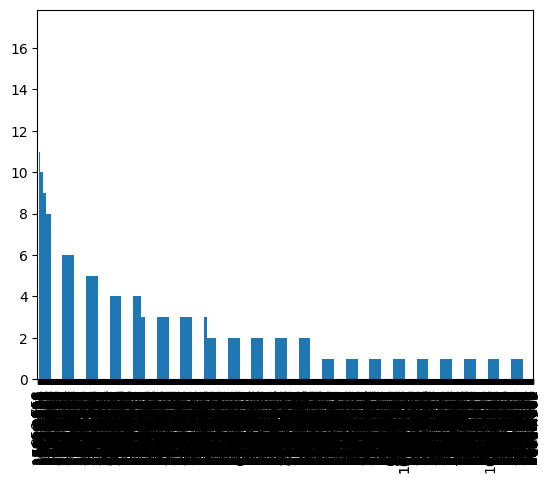

In [ ]:
df["Item_Outlet_Sales"].value_counts().plot(kind="bar");

<Axes: xlabel='Item_Outlet_Sales', ylabel='Density'>

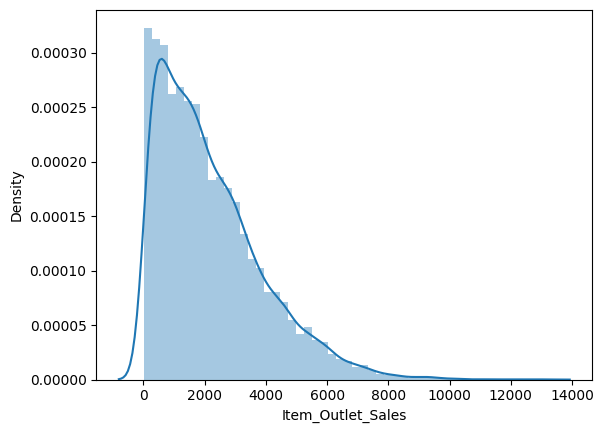

In [ ]:
sns.distplot(df["Item_Outlet_Sales"])

# (C) Preprocessing the dataset

## (1) Quick (EDA) Checks

### Checking the Variable Relations
- Checking the Variable Relations for deterninating variables which we will be focued on 

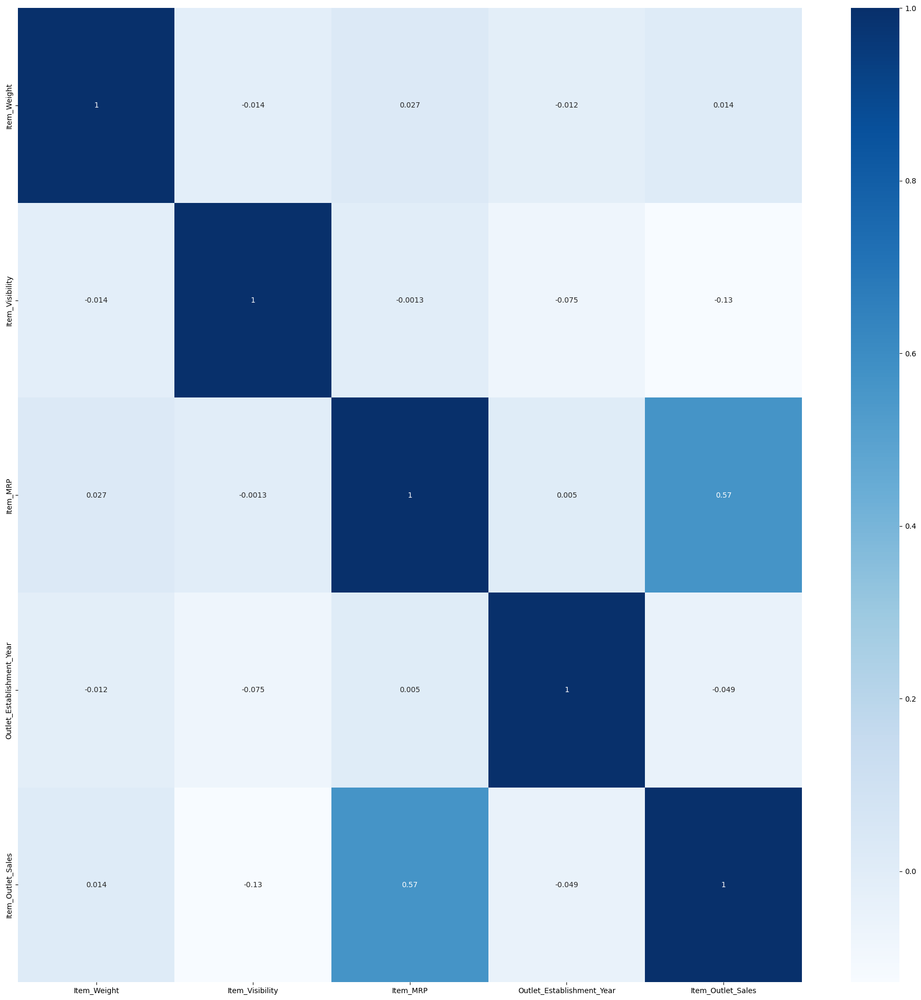

In [ ]:
# Extracting the relations
corr = df.corr()

# Configurating plot
col_size = len(df.columns)
plt.figure(figsize=(col_size*2,col_size*2))

# Plotting
sns.heatmap(corr, annot=True, cmap="Blues");

Text(0.5, 1.0, 'Negative Correlation (neg> 0.7)')

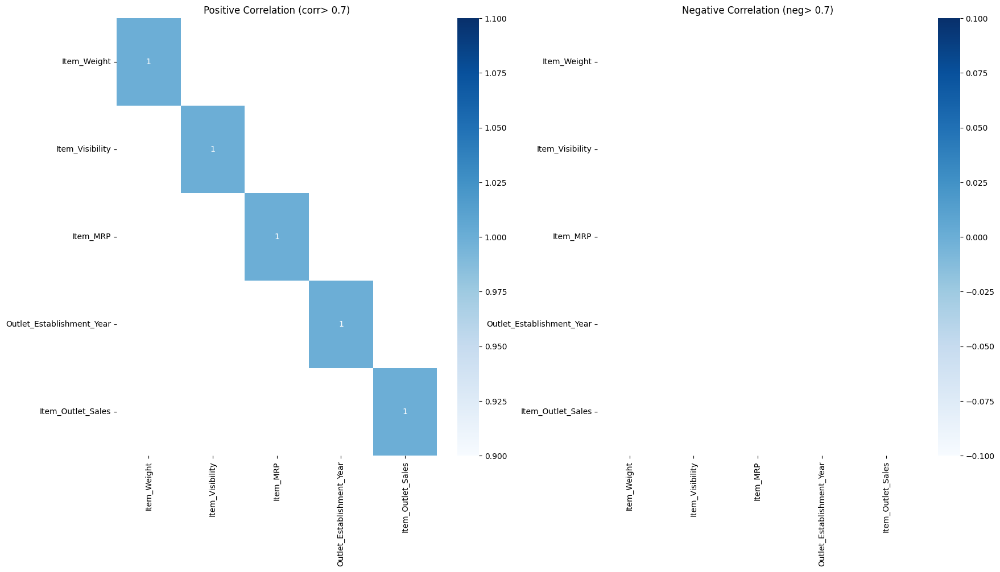

In [ ]:
# Extracting the pos & neg corrs
p_th = 0.7
positive = corr[corr>p_th]

n_th = -0.7
negative = corr[corr<n_th]

# Configurating plot
col_size = len(df.columns)
plt.figure(figsize=(20,10))

# plotting as multiple axis
plt.subplot(1,2,1)
sns.heatmap(positive, annot=True, cmap="Blues");
plt.title("Positive Correlation (corr> 0.7)")

plt.subplot(1,2,2)
sns.heatmap(negative, annot=True, cmap="Blues");
plt.title("Negative Correlation (neg> 0.7)")

### Distribution Check

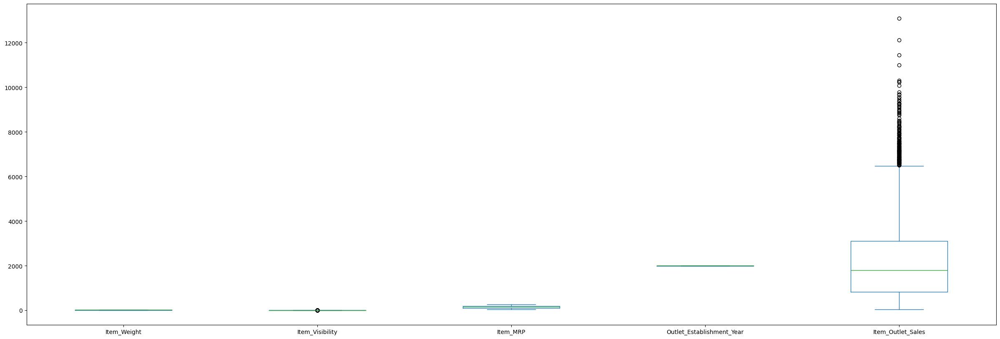

In [ ]:
df.plot.box(figsize=(30,10));

In [ ]:
df.columns

Index(['Item_Identifier', 'Item_Weight', 'Item_Fat_Content', 'Item_Visibility',
       'Item_Type', 'Item_MRP', 'Outlet_Identifier',
       'Outlet_Establishment_Year', 'Outlet_Size', 'Outlet_Location_Type',
       'Outlet_Type', 'Item_Outlet_Sales'],
      dtype='object')

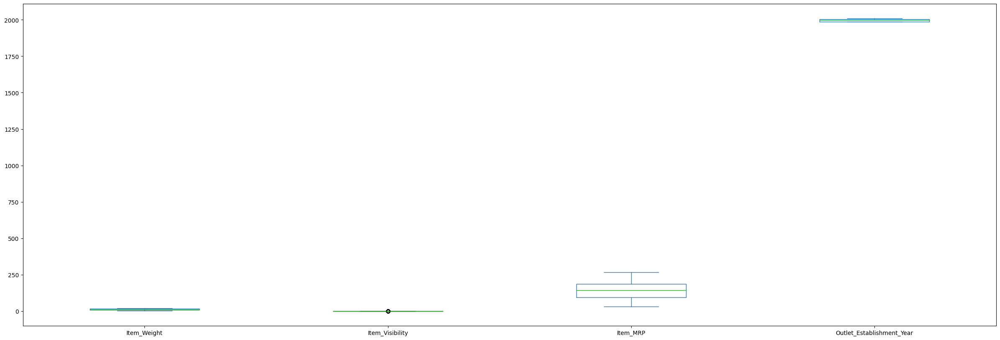

In [ ]:
df.loc[:, [col for col in df.columns if col not in ["Item_Outlet_Sales"]]].plot.box(figsize=(30,10));

<Axes: xlabel='Item_MRP', ylabel='Density'>

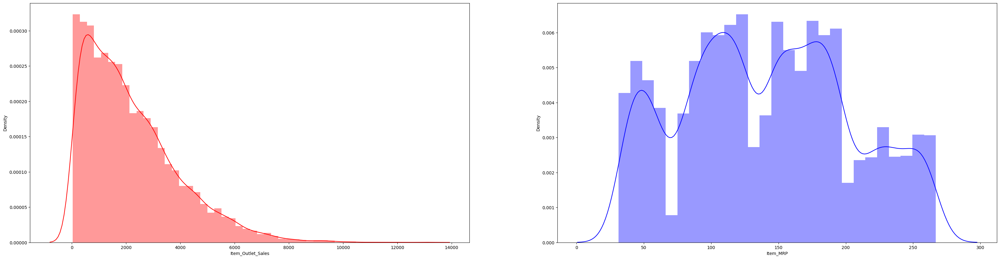

In [ ]:
# Configurating plotings
plt.figure(figsize=(40,10))

# Plotting the axises
plt.subplot(1,2,1)
sns.distplot( df['Item_Outlet_Sales'], color='r')

plt.subplot(1,2,2)
sns.distplot(df['Item_MRP'], color='b')

## (2) Missing Value 

### Finding out the missing values

In [ ]:
# find the null values
df.isnull().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

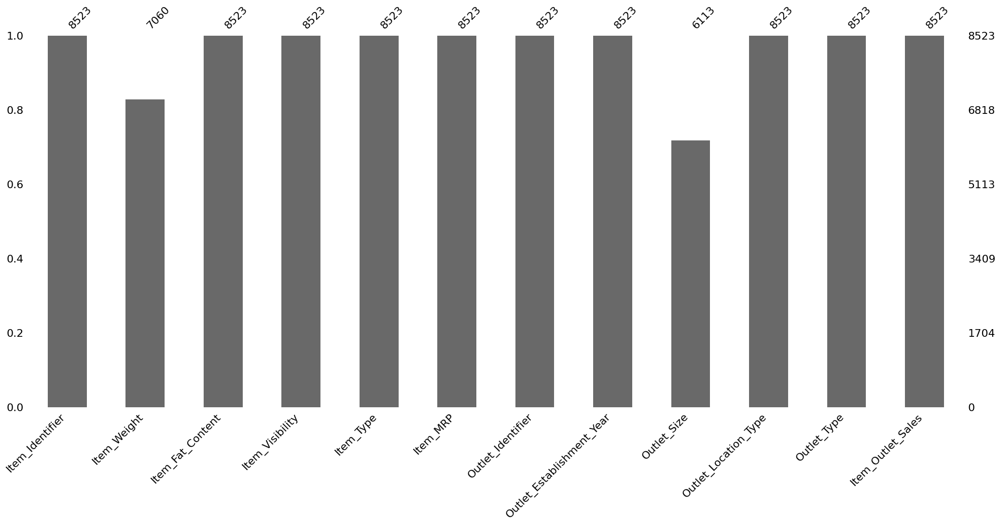

In [ ]:
import missingno as msno
msno.bar(df);

<Axes: >

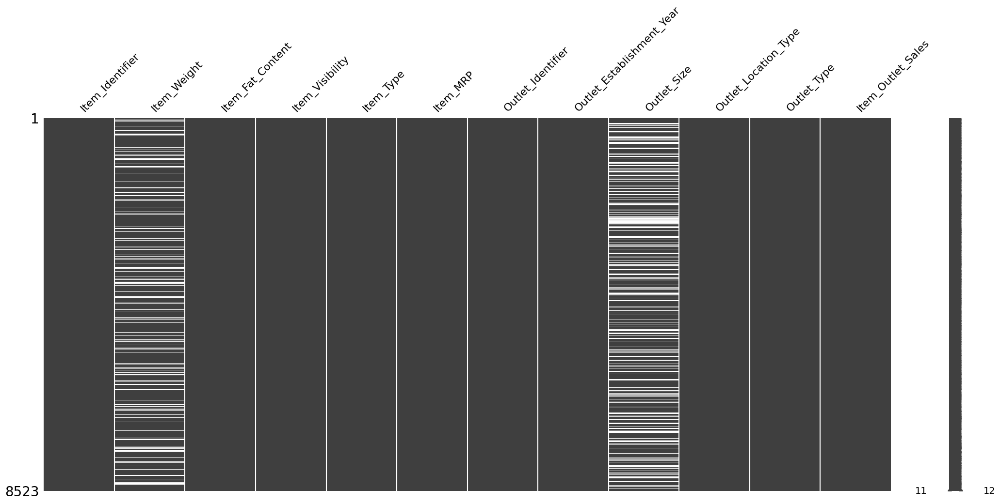

In [ ]:
msno.matrix(df)

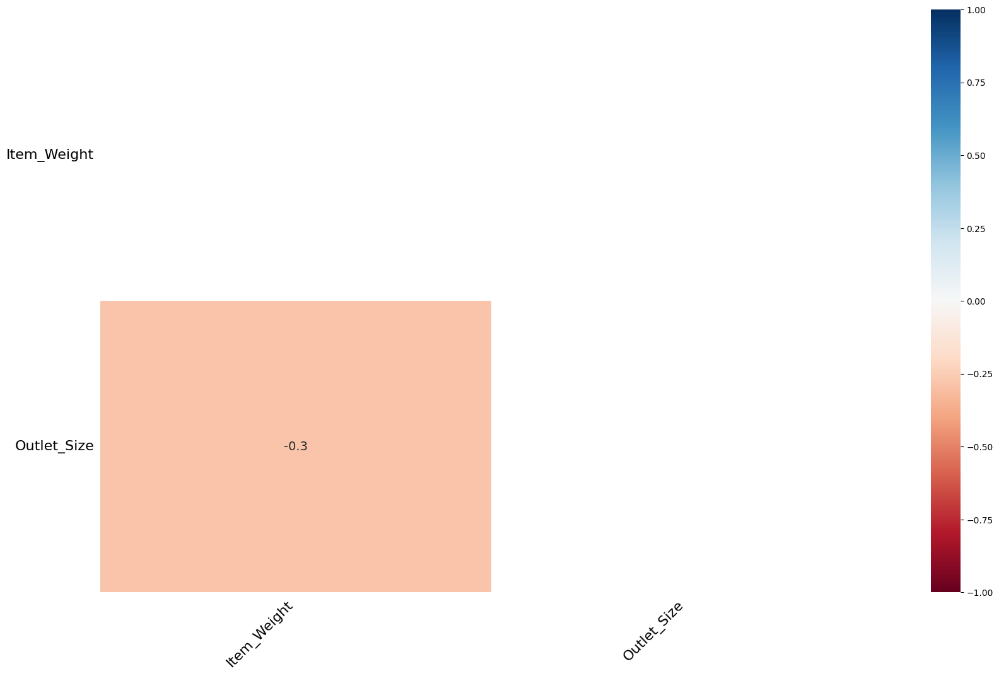

In [ ]:
msno.heatmap(df);

### Handling The Missing Values


In [ ]:
# fill the missing values
item_weight_mean = df.pivot_table(values = "Item_Weight", index = 'Item_Identifier')
item_weight_mean

,Item_Weight
Item_Identifier,
DRA12,11.600
DRA24,19.350
DRA59,8.270
DRB01,7.390
DRB13,6.115
...,...
NCZ30,6.590
NCZ41,19.850
NCZ42,10.500


In [ ]:
miss_bool = df['Item_Weight'].isnull()
miss_bool

0       False
1       False
2       False
3       False
4       False
        ...  
8518    False
8519    False
8520    False
8521    False
8522    False
Name: Item_Weight, Length: 8523, dtype: bool

In [ ]:
for i, item in enumerate(df['Item_Identifier']):
    if miss_bool[i]:
        if item in item_weight_mean:
            df['Item_Weight'][i] = item_weight_mean.loc[item]['Item_Weight']
        else:
            df['Item_Weight'][i] = np.mean(df['Item_Weight'])

In [ ]:
df['Item_Weight'].isnull().sum()

0

In [ ]:
outlet_size_mode = df.pivot_table(values='Outlet_Size', columns='Outlet_Type', aggfunc=(lambda x: x.mode()[0]))
outlet_size_mode

Outlet_Type,Grocery Store,Supermarket Type1,Supermarket Type2,Supermarket Type3
Outlet_Size,Small,Small,Medium,Medium


In [ ]:
miss_bool = df['Outlet_Size'].isnull()
df.loc[miss_bool, 'Outlet_Size'] = df.loc[miss_bool, 'Outlet_Type'].apply(lambda x: outlet_size_mode[x])

In [ ]:
df['Outlet_Size'].isnull().sum()

0

In [ ]:
sum(df['Item_Visibility']==0)

526

In [ ]:
# replace zeros with mean
df.loc[:, 'Item_Visibility'].replace([0], [df['Item_Visibility'].mean()], inplace=True)

In [ ]:
sum(df['Item_Visibility']==0)

0

In [ ]:
df.isnull().sum()

Item_Identifier              0
Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
Item_Outlet_Sales            0
dtype: int64

## (3) Feature Engineering

### Removing unnessesary variables

In [ ]:
# check for categorical attributes
cat_col = []
for x in df.dtypes.index:
    if df.dtypes[x] == 'object':
        cat_col.append(x)
cat_col

['Item_Identifier',
 'Item_Fat_Content',
 'Item_Type',
 'Outlet_Identifier',
 'Outlet_Size',
 'Outlet_Location_Type',
 'Outlet_Type']

In [ ]:
cat_col.remove('Item_Identifier')
cat_col.remove('Outlet_Identifier')
cat_col

['Item_Fat_Content',
 'Item_Type',
 'Outlet_Size',
 'Outlet_Location_Type',
 'Outlet_Type']

In [ ]:
# print the categorical columns
for col in cat_col:
    print(col)
    print(df[col].value_counts())
    print()

Item_Fat_Content
Low Fat    5089
Regular    2889
LF          316
reg         117
low fat     112
Name: Item_Fat_Content, dtype: int64

Item_Type
Fruits and Vegetables    1232
Snack Foods              1200
Household                 910
Frozen Foods              856
Dairy                     682
Canned                    649
Baking Goods              648
Health and Hygiene        520
Soft Drinks               445
Meat                      425
Breads                    251
Hard Drinks               214
Others                    169
Starchy Foods             148
Breakfast                 110
Seafood                    64
Name: Item_Type, dtype: int64

Outlet_Size
Small     4798
Medium    2793
High       932
Name: Outlet_Size, dtype: int64

Outlet_Location_Type
Tier 3    3350
Tier 2    2785
Tier 1    2388
Name: Outlet_Location_Type, dtype: int64

Outlet_Type
Supermarket Type1    5577
Grocery Store        1083
Supermarket Type3     935
Supermarket Type2     928
Name: Outlet_Type, dtype: int6

### Variable Creating

In [ ]:
# combine item fat content
df['Item_Fat_Content'] = df['Item_Fat_Content'].replace({'LF':'Low Fat', 'reg':'Regular', 'low fat':'Low Fat'})
df_test['Item_Fat_Content'] = df_test['Item_Fat_Content'].replace({'LF':'Low Fat', 'reg':'Regular', 'low fat':'Low Fat'})

df['Item_Fat_Content'].value_counts()

Low Fat    5517
Regular    3006
Name: Item_Fat_Content, dtype: int64

In [ ]:
df['New_Item_Type'] = df['Item_Identifier'].apply(lambda x: x[:2])
df_test['New_Item_Type'] = df_test['Item_Identifier'].apply(lambda x: x[:2])

df['New_Item_Type']

0       FD
1       DR
2       FD
3       FD
4       NC
        ..
8518    FD
8519    FD
8520    NC
8521    FD
8522    DR
Name: New_Item_Type, Length: 8523, dtype: object

In [ ]:
df['New_Item_Type'] = df['New_Item_Type'].map({'FD':'Food', 'NC':'Non-Consumable', 'DR':'Drinks'})
df_test['New_Item_Type'] = df_test['New_Item_Type'].map({'FD':'Food', 'NC':'Non-Consumable', 'DR':'Drinks'})

df['New_Item_Type'].value_counts()

Food              6125
Non-Consumable    1599
Drinks             799
Name: New_Item_Type, dtype: int64

In [ ]:
df.loc[df['New_Item_Type']=='Non-Consumable', 'Item_Fat_Content'] = 'Non-Edible'
df_test.loc[df['New_Item_Type']=='Non-Consumable', 'Item_Fat_Content'] = 'Non-Edible'

df['Item_Fat_Content'].value_counts()

Low Fat       3918
Regular       3006
Non-Edible    1599
Name: Item_Fat_Content, dtype: int64

In [ ]:
# create small values for establishment year
df['Outlet_Years'] = 2013 - df['Outlet_Establishment_Year']
df_test['Outlet_Years'] = 2013 - df_test['Outlet_Establishment_Year']

In [ ]:
df['Outlet_Years']

0       14
1        4
2       14
3       15
4       26
        ..
8518    26
8519    11
8520     9
8521     4
8522    16
Name: Outlet_Years, Length: 8523, dtype: int64

In [ ]:
df.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,New_Item_Type,Outlet_Years
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380,Food,14
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228,Drinks,4
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700,Food,14
3,FDX07,19.20,Regular,0.066132,Fruits and Vegetables,182.0950,OUT010,1998,Small,Tier 3,Grocery Store,732.3800,Food,15
4,NCD19,8.93,Non-Edible,0.066132,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052,Non-Consumable,26


### Feature Selection

In [ ]:
df.drop(columns=['Outlet_Establishment_Year', 'Item_Identifier', 'Outlet_Identifier'], axis=1, inplace=True)

In [ ]:
df_test.drop(columns=['Outlet_Establishment_Year', 'Item_Identifier', 'Outlet_Identifier'], axis=1, inplace=True)

## (4) Outlier Analysis
- Outliers must be analyse according to re-sampling method because of to detect anomaly (Fraud Detection).

### Visual Approach

In [ ]:
target_var = "Item_Outlet_Sales"

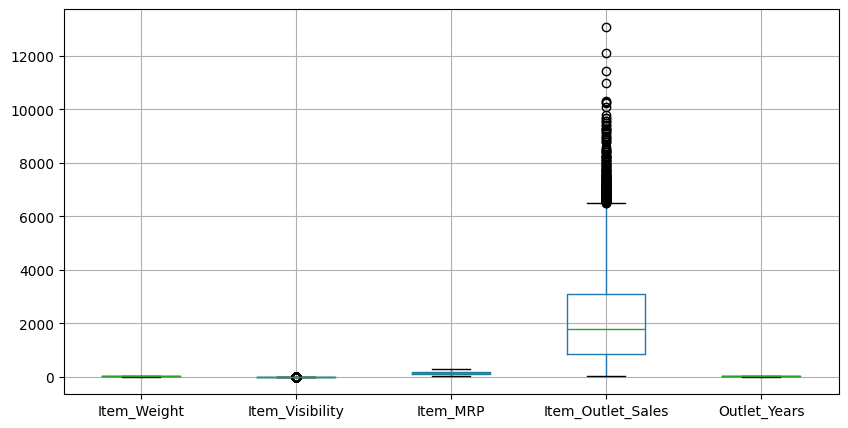

In [ ]:
plt.figure(figsize=(10,5));
df.boxplot();

In [ ]:
df.columns

Index(['Item_Weight', 'Item_Fat_Content', 'Item_Visibility', 'Item_Type',
       'Item_MRP', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type',
       'Item_Outlet_Sales', 'New_Item_Type', 'Outlet_Years'],
      dtype='object')

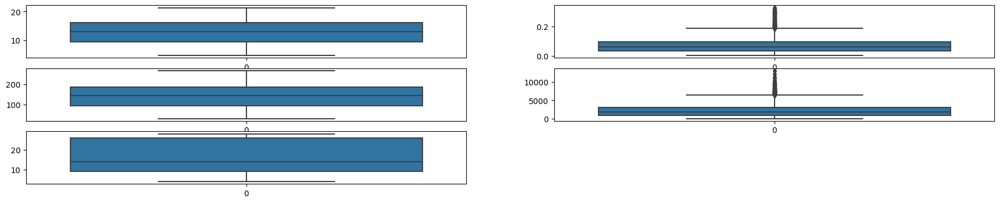

In [ ]:
cum_col_sie = len(df.select_dtypes(exclude=("object","category")).columns)

plt.figure(figsize=(22, 7))
for i, col in enumerate(df.select_dtypes(exclude=("object","category")).columns):
  plt.subplot(5, cum_col_sie//5+1, i+1)
  sns.boxplot(df[col]);

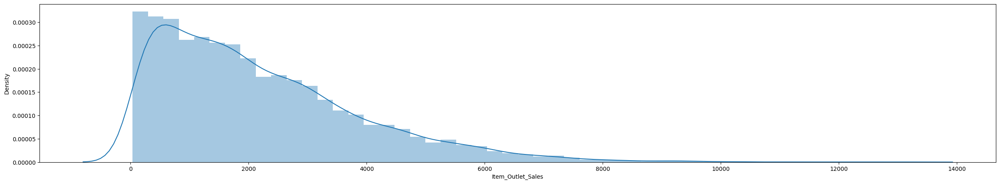

In [ ]:
plt.figure(figsize=(30, 5))
sns.distplot(df[target_var]);

### IQR approach

- Note that
  - If you want to change a certain pertantage of the data for handling outliers.
    - You can adjust the ratio param forn  IQR_calculator funct to adjust inliar range.
  - If the ratio increate, 
    - outlier count will be reduce. Just the most outliers will be captured. 

#### Calculating IQR
- Calculates
  - __IQR__ pandas series for all the given variables
  - __l_th__ lower_threashold pandas series for all the given variables
  - __h_th__ higher_threashold pandas series for all the given variables

In [ ]:
def IQR_calculator(df, ratio=1.5):
    # Calculating the quartiles
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    
    # IQR range calculation
    IQR = Q3 -Q1

    # Determinating the boundaries
    lower_threashold = Q1 - ratio * IQR
    higher_threashold = Q3 + ratio *IQR
    
    return IQR, lower_threashold, higher_threashold

In [ ]:
IQR, l_th, h_th = IQR_calculator(df, ratio=1.5)

In [ ]:
from pprint import pprint
for i in [IQR, l_th, h_th]:
  print("-"*20)
  pprint(i)
  print("-"*20, end="\n"*2)

--------------------
Item_Weight             6.6900
Item_Visibility         0.0615
Item_MRP               91.8172
Item_Outlet_Sales    2267.0490
Outlet_Years           17.0000
dtype: float64
--------------------

--------------------
Item_Weight            -0.725000
Item_Visibility        -0.059165
Item_MRP              -43.899300
Item_Outlet_Sales   -2566.326100
Outlet_Years          -16.500000
dtype: float64
--------------------

--------------------
Item_Weight            26.035000
Item_Visibility         0.186835
Item_MRP              323.369500
Item_Outlet_Sales    6501.869900
Outlet_Years           51.500000
dtype: float64
--------------------



### Finding out The outlier values
- Finds __is_outlier__ and __is_outlier_val__ dataframes which include boolean value for ever individual value.

In [ ]:
def find_outlier_single(data:pd.DataFrame, lower_threashold:float, higher_threashold:float)->pd.DataFrame:
    boolean_outlier_df = (data < lower_threashold) | (higher_threashold < data)
    return boolean_outlier_df

In [ ]:
def find_outlier(df:pd.DataFrame, lower_threashold:pd.Series, higher_threashold:pd.Series)->pd.DataFrame:
    data = df[lower_threashold.index]
    boolean_outlier_df = (data < lower_threashold) | (higher_threashold < data)
    return boolean_outlier_df

In [ ]:
# Getting the outlier indexes
is_outlier = find_outlier(df, l_th, h_th)
is_outlier.head()

,Item_Weight,Item_Visibility,Item_MRP,Item_Outlet_Sales,Outlet_Years
0,False,False,False,False,False
1,False,False,False,False,False
2,False,False,False,False,False
3,False,False,False,False,False
4,False,False,False,False,False


In [ ]:
is_outlier.sum()

Item_Weight            0
Item_Visibility      173
Item_MRP               0
Item_Outlet_Sales    186
Outlet_Years           0
dtype: int64

In [ ]:
outlier_ratios = is_outlier.sum() / df[is_outlier.columns].count()
outlier_ratios

Item_Weight          0.000000
Item_Visibility      0.020298
Item_MRP             0.000000
Item_Outlet_Sales    0.021823
Outlet_Years         0.000000
dtype: float64

In [ ]:
signf = 0.05
outlier_ratios[outlier_ratios > signf]

Series([], dtype: float64)

### Handling outlier
- There are no outliers in the dataset, so no handling process is implemented

#### Util Functions

In [ ]:
def mean_assignment(data:pd.Series, is_outlier:pd.Series, value:float):
  "It assigns given value to the outlier values"
  data[is_outlier] = value
  return data

# usage # df["c1"] = mean_assignment(df["c1"], is_outlier["c1"], df["c1"].mean()):

In [ ]:
def boundary_casting(data:pd.Series, l_th:float, h_th:float):
  "It assigns border values to the outlier values"
  
  data[ data < l_th ] = l_th
  data[ h_th < data ] = h_th

  return data

# (D) Exploratory Data Analysis

## Dataset 

### Spesifications

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Item_Weight           8523 non-null   float64
 1   Item_Fat_Content      8523 non-null   object 
 2   Item_Visibility       8523 non-null   float64
 3   Item_Type             8523 non-null   object 
 4   Item_MRP              8523 non-null   float64
 5   Outlet_Size           8523 non-null   object 
 6   Outlet_Location_Type  8523 non-null   object 
 7   Outlet_Type           8523 non-null   object 
 8   Item_Outlet_Sales     8523 non-null   float64
 9   New_Item_Type         8523 non-null   object 
 10  Outlet_Years          8523 non-null   int64  
dtypes: float64(4), int64(1), object(6)
memory usage: 732.6+ KB


In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Item_Weight,8523.0,12.857645,4.226124,4.555000,9.310000,12.857645,16.000000,21.350000
Item_Visibility,8523.0,0.070213,0.048742,0.003575,0.033085,0.062517,0.094585,0.328391
Item_MRP,8523.0,140.992782,62.275067,31.290000,93.826500,143.012800,185.643700,266.888400
Item_Outlet_Sales,8523.0,2181.288914,1706.499616,33.290000,834.247400,1794.331000,3101.296400,13086.964800
Outlet_Years,8523.0,15.168133,8.371760,4.000000,9.000000,14.000000,26.000000,28.000000


In [ ]:
pd.unique(df.select_dtypes(include=["object","category"]).values.ravel('k'))

array(['Low Fat', 'Regular', 'Non-Edible', 'Dairy', 'Soft Drinks', 'Meat',
       'Fruits and Vegetables', 'Household', 'Baking Goods',
       'Snack Foods', 'Frozen Foods', 'Breakfast', 'Health and Hygiene',
       'Hard Drinks', 'Canned', 'Breads', 'Starchy Foods', 'Others',
       'Seafood', 'Medium', 'Small', 'High', 'Tier 1', 'Tier 3', 'Tier 2',
       'Supermarket Type1', 'Supermarket Type2', 'Grocery Store',
       'Supermarket Type3', 'Food', 'Drinks', 'Non-Consumable'],
      dtype=object)

### Temporary encoding

#### Via pandas

In [ ]:
encoded_df = df.copy()

In [ ]:
for col in encoded_df.select_dtypes(include= ["object","category"]):
  encoded_df[col] = encoded_df[col].astype("category").cat.codes

In [ ]:
for col in encoded_df.select_dtypes(include=[bool]):
  encoded_df[col] = encoded_df[col].astype(int)

In [ ]:
encoded_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Item_Weight           8523 non-null   float64
 1   Item_Fat_Content      8523 non-null   int8   
 2   Item_Visibility       8523 non-null   float64
 3   Item_Type             8523 non-null   int8   
 4   Item_MRP              8523 non-null   float64
 5   Outlet_Size           8523 non-null   int8   
 6   Outlet_Location_Type  8523 non-null   int8   
 7   Outlet_Type           8523 non-null   int8   
 8   Item_Outlet_Sales     8523 non-null   float64
 9   New_Item_Type         8523 non-null   int8   
 10  Outlet_Years          8523 non-null   int64  
dtypes: float64(4), int64(1), int8(6)
memory usage: 383.0 KB


In [ ]:
encoded_df["New_Item_Type"].unique()

array([1, 0, 2], dtype=int8)

#### Via Sklean Label Encode

In [ ]:
encoded_df_sk = df.copy()

In [ ]:
from sklearn.preprocessing import LabelEncoder

tmp_sk_encoder = {}
for col in encoded_df_sk.select_dtypes(include= ["object","category",bool]):
  tmp_encoder = LabelEncoder()
  encoded_df_sk[col] = tmp_encoder.fit_transform(encoded_df_sk[col])
  tmp_sk_encoder[col] = tmp_encoder

In [ ]:
encoded_df_sk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Item_Weight           8523 non-null   float64
 1   Item_Fat_Content      8523 non-null   int64  
 2   Item_Visibility       8523 non-null   float64
 3   Item_Type             8523 non-null   int64  
 4   Item_MRP              8523 non-null   float64
 5   Outlet_Size           8523 non-null   int64  
 6   Outlet_Location_Type  8523 non-null   int64  
 7   Outlet_Type           8523 non-null   int64  
 8   Item_Outlet_Sales     8523 non-null   float64
 9   New_Item_Type         8523 non-null   int64  
 10  Outlet_Years          8523 non-null   int64  
dtypes: float64(4), int64(7)
memory usage: 732.6 KB


In [ ]:
encoded_df_sk["New_Item_Type"].unique()

array([1, 0, 2])

In [ ]:
tmp_sk_encoder["New_Item_Type"].inverse_transform(encoded_df_sk["New_Item_Type"].unique())

array(['Food', 'Drinks', 'Non-Consumable'], dtype=object)

## Univariate Analysis

In [ ]:
num_cols = df.select_dtypes(include=("int64","float64"), exclude=("bool") ).columns
cat_cols = df.select_dtypes(exclude=("int64","float64")).columns

In [ ]:
num_cols

Index(['Item_Weight', 'Item_Visibility', 'Item_MRP', 'Item_Outlet_Sales',
       'Outlet_Years'],
      dtype='object')

In [ ]:
len(df.columns), df.columns

(11,
 Index(['Item_Weight', 'Item_Fat_Content', 'Item_Visibility', 'Item_Type',
        'Item_MRP', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type',
        'Item_Outlet_Sales', 'New_Item_Type', 'Outlet_Years'],
       dtype='object'))

In [ ]:
df[cat_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Item_Fat_Content      8523 non-null   object
 1   Item_Type             8523 non-null   object
 2   Outlet_Size           8523 non-null   object
 3   Outlet_Location_Type  8523 non-null   object
 4   Outlet_Type           8523 non-null   object
 5   New_Item_Type         8523 non-null   object
dtypes: object(6)
memory usage: 399.6+ KB


In [ ]:
df[num_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Item_Weight        8523 non-null   float64
 1   Item_Visibility    8523 non-null   float64
 2   Item_MRP           8523 non-null   float64
 3   Item_Outlet_Sales  8523 non-null   float64
 4   Outlet_Years       8523 non-null   int64  
dtypes: float64(4), int64(1)
memory usage: 333.1 KB


### Target Variable

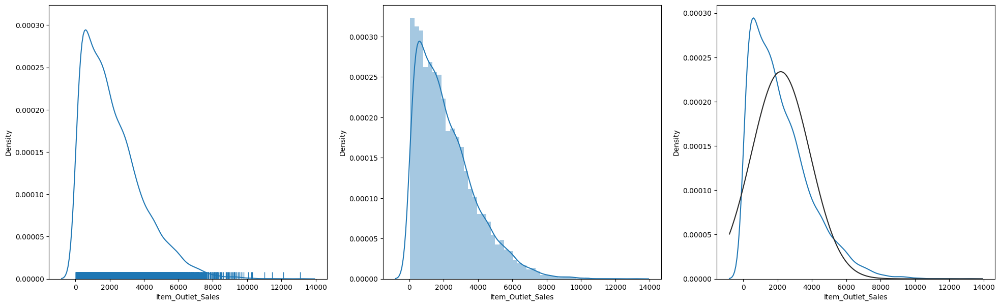

In [ ]:
from scipy.stats import norm


target_var = "Item_Outlet_Sales"

plt.figure(figsize=(24,7))

plt.subplot(1,3,1)
sns.distplot(df[target_var], rug=True, hist=False);

plt.subplot(1,3,2)
sns.distplot(df[target_var], rug=False, hist=True);

plt.subplot(1,3,3)
sns.distplot(df[target_var], fit=norm, rug=False, hist=False);

### Feature Variables [Numerical]

#### setting the plotting params

In [ ]:
# Defining the params
target_var = "Item_Outlet_Sales"
#num_cols = df.select_dtypes(exclude='category').columns
num_col_size = len(num_cols)
cols, rows = (3, num_col_size//3 + 1) if num_col_size > 5 else (5, 1) 
figsize = (cols*7, rows*5)

#### [histplot] Distributions

In [ ]:
num_cols

Index(['Item_Weight', 'Item_Visibility', 'Item_MRP', 'Item_Outlet_Sales',
       'Outlet_Years'],
      dtype='object')

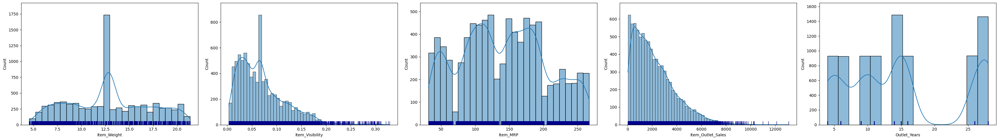

In [ ]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    ax=fig.add_subplot(rows,cols,i+1)
    sns.histplot(x=df[col], data=df, kde=True, ax=ax)
    sns.rugplot(x=df[col], data=df, height=.03, color='darkblue', ax=ax)
    
fig.tight_layout()  
plt.show()

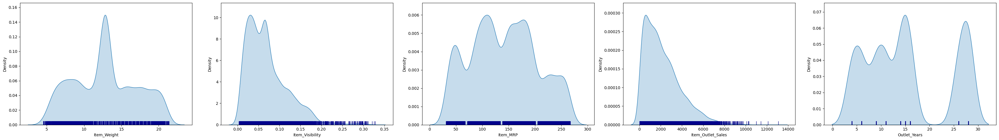

In [ ]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    ax=fig.add_subplot(rows,cols,i+1)
    sns.kdeplot(x=df[col], data=df ,shade=True, ax=ax)
    sns.rugplot(x=df[col], data=df, height=.03, color='darkblue', ax=ax)
    
fig.tight_layout()  
plt.show()

#### [boxplot] Distributions with quartiles (Outlier)

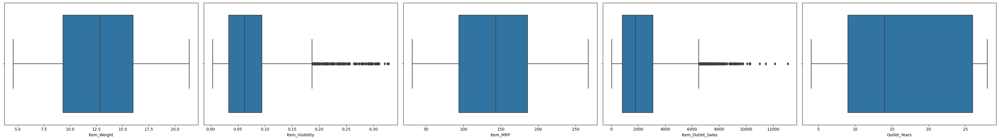

In [ ]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.boxplot(x=df[col], ax=ax)
    
fig.tight_layout()  
plt.show()

#### [violinplot] Distributions with quartiles and density

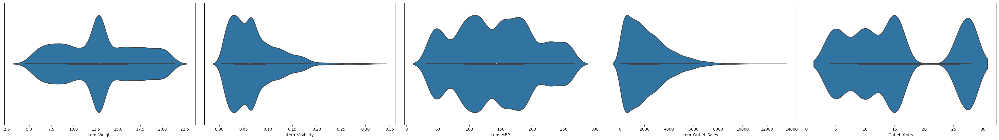

In [ ]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # violinplot
    sns.violinplot(x=df[col], show_medians=True, ax=ax)
    
fig.tight_layout()  
plt.show()

#### [stripplot] spread of the data with stripplot

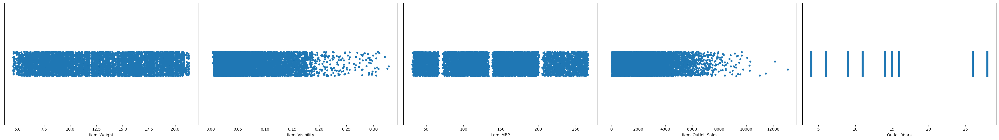

In [ ]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # stripplot
    sns.stripplot(x=df[col], ax=ax)
    
fig.tight_layout()  
plt.show()

#### [swarmplot] spread of the data with stripplot (avoids overlap)
```python
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # swarmplot
    sns.swarmplot(x=df[col], ax=ax)
    
fig.tight_layout()  
plt.show()
```

#### [scatterplot] Spread of data 

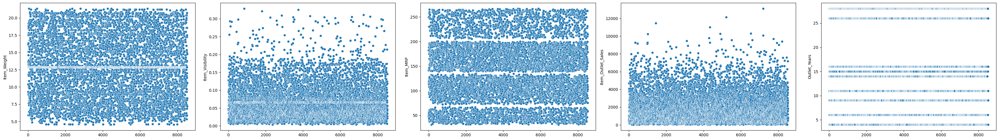

In [ ]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # scatterplot
    sns.scatterplot(x = df[col].index, y= df[col], ax=ax)
    
fig.tight_layout()  
plt.show()

#### [lineplot] Trend

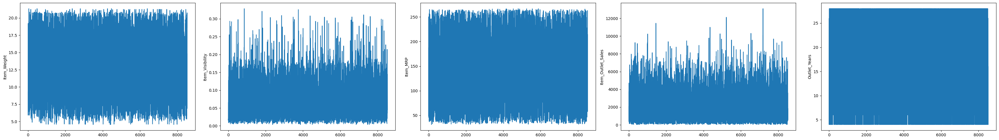

In [ ]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.lineplot(x=df[col].index, y=df[col], ax=ax)
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)
    
fig.tight_layout()  
plt.show()

### Feature Variables [Categorical]

#### setting the plotting params

In [ ]:
# Defining the params
target_var = "Item_Outlet_Sales"
#num_cols = df.select_dtypes(exclude='category').columns
cat_col_size = len(cat_cols)
cols, rows = (3, cat_col_size//3 + 1) if cat_col_size > 5 else (5, 1) 
figsize = (cols*7, rows*5)

In [ ]:
cat_cols

Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Size', 'Outlet_Location_Type',
       'Outlet_Type', 'New_Item_Type'],
      dtype='object')

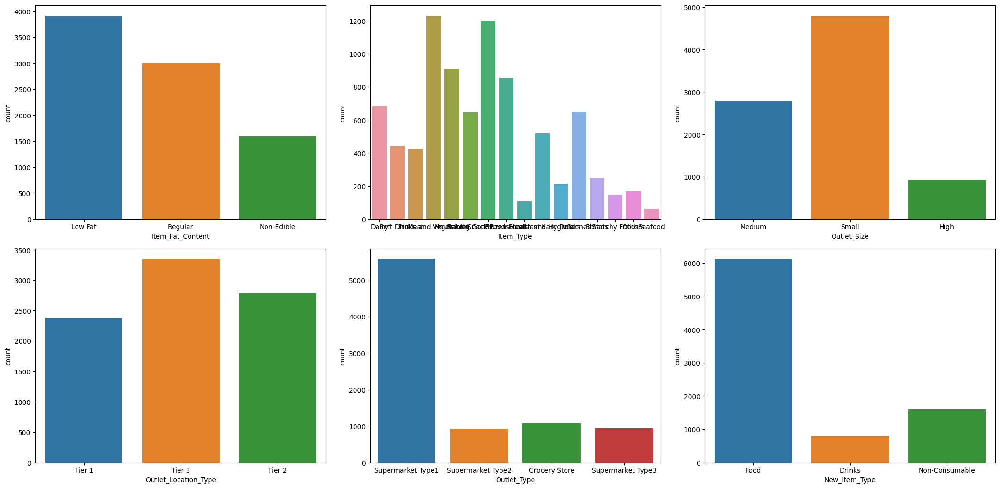

In [ ]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(cat_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.countplot(x=df[col], ax=ax)
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)
    
fig.tight_layout()  
plt.show()

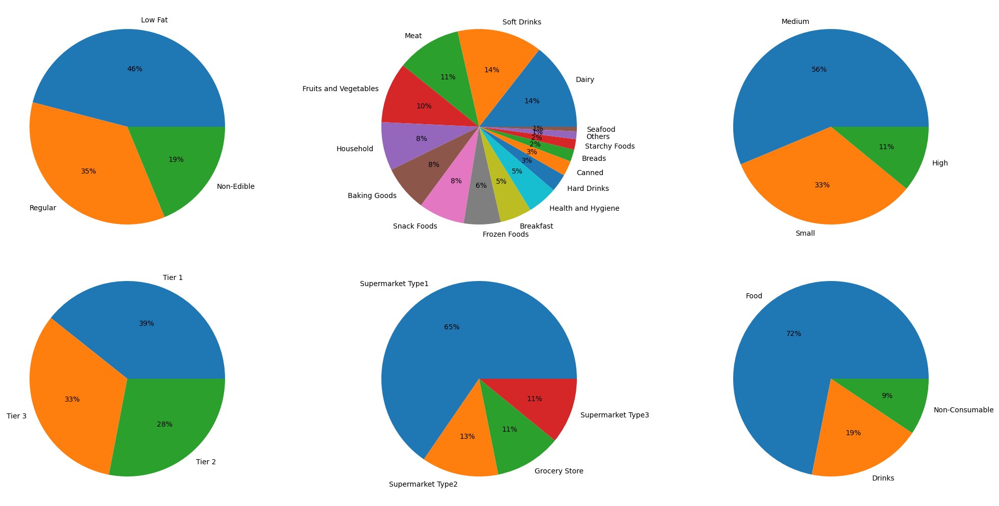

In [ ]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(cat_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
  
    # boxplot
    plt.pie(df[col].value_counts(), labels=df[col].unique(), autopct="%.0f%%");
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)
    
fig.tight_layout()  
plt.show()

## Relations

### Quick Variable Relation

In [ ]:
def rel_filter(df:pd.DataFrame, th:float)->pd.DataFrame:
  # Calculating the relations
  corr = df.corr()

  # filtering the relations
  filtered_corr = corr[corr > th]  if th > 0.0 else corr[corr < th]

  return filtered_corr

def rel_plotter(corr:pd.DataFrame, title:str="Correlations", figsize:tuple=None, cmap="Blues", annot=True):
  
  # plotting configurations
  if figsize != None: plt.figure(figsize=figsize)

  # plotting the relattions
  sns.heatmap(corr, cmap="Blues", annot=True)
  plt.title(title);

def get_relations(corr:pd.DataFrame, th:float)->list:

  # decleration of params
  columns = corr.columns
  is_exceed = (lambda rel: rel > th)  if th > 0 else (lambda rel: rel < th)  

  # getting the column names which exceedes the threashold
  filtered_relations = list()
  for row in columns:
    for col in columns:
        
        # Pass the correaltion with itself
        if col==row: continue

        # Collect variables which exvide threashold correlation 
        cur_corr = corr.loc[row, col]
        if  is_exceed(cur_corr):

          # Check whether the record have already added
          is_already_added = [ all([ e in record for e in [row, col] ])  for record in filtered_relations ]
          
          # Add if it have not already added
          if not any(is_already_added): filtered_relations.append([row, col, np.round(cur_corr, 2)]) 
  
  return filtered_relations

In [ ]:
get_relations(df.corr(), 0.85), get_relations(encoded_df_sk.corr(), 0.85)

([], [])

In [ ]:
get_relations(df.corr(), 0.5), get_relations(encoded_df_sk.corr(), 0.5)

([['Item_MRP', 'Item_Outlet_Sales', 0.57]],
 [['Item_MRP', 'Item_Outlet_Sales', 0.57]])

In [ ]:
get_relations(df.corr(), (-0.7)), get_relations(encoded_df_sk.corr(),  (-0.7))

([], [])

In [ ]:
get_relations(df.corr(), -0.5), get_relations(encoded_df_sk.corr(), -0.5)

([], [])

In [ ]:
def get_var_corrs(df:pd.DataFrame, var:str, top_n:int=5, th:float=None):
  # checking the params whether valid
  if var not in df.columns: raise f"'{var}' column does not exist in the dataframe"

  # Calculating the correlation
  var_corrs = df.corr()[var].drop(var)

  # Filtering & sorting 
  if th != None:

    # Filtering
    filter = (lambda df: df[df > th] )  if th > 0 else (lambda df: df[df < th]) 
    var_corrs = filter(var_corrs)
    
    # Sorting
    is_asc = False if th > 0 else True
    var_corrs = var_corrs.sort_values(ascending=is_asc)
    var_corrs = var_corrs[:top_n]

  return var_corrs

In [ ]:
p_corrs = get_var_corrs(df, target_var, top_n=5, th=0.25)
p_corrs_names = p_corrs.index
p_corrs

Item_MRP    0.567574
Name: Item_Outlet_Sales, dtype: float64

In [ ]:
n_corrs = get_var_corrs(df, target_var, top_n=5, th=-0.25)
n_corrs_names = n_corrs.index
n_corrs

Series([], Name: Item_Outlet_Sales, dtype: float64)

### Correlation

In [ ]:
df.corr()

,Item_Weight,Item_Visibility,Item_MRP,Item_Outlet_Sales,Outlet_Years
Item_Weight,1.000000,-0.017450,0.024756,0.011550,0.008301
Item_Visibility,-0.017450,1.000000,-0.005259,-0.134138,0.078355
Item_MRP,0.024756,-0.005259,1.000000,0.567574,-0.005020
Item_Outlet_Sales,0.011550,-0.134138,0.567574,1.000000,0.049135
Outlet_Years,0.008301,0.078355,-0.005020,0.049135,1.000000


In [ ]:
encoded_df_sk.corr()

,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,New_Item_Type,Outlet_Years
Item_Weight,1.000000,-0.002151,-0.017450,0.028015,0.024756,-0.014105,0.004088,-0.000566,0.011550,0.063232,0.008301
Item_Fat_Content,-0.002151,1.000000,0.022745,-0.066248,0.008594,-0.000829,0.000958,0.000084,0.015249,0.186485,-0.001451
Item_Visibility,-0.017450,0.022745,1.000000,-0.036000,-0.005259,0.097533,-0.027859,-0.179604,-0.134138,-0.046290,0.078355
Item_Type,0.028015,-0.066248,-0.036000,1.000000,0.032651,-0.000218,0.003084,0.003053,0.017048,0.007456,-0.004970
Item_MRP,0.024756,0.008594,-0.005259,0.032651,1.000000,0.000872,0.000232,-0.001975,0.567574,0.032517,-0.005020
Outlet_Size,-0.014105,-0.000829,0.097533,-0.000218,0.000872,1.000000,-0.480075,-0.401373,-0.162753,-0.001276,-0.425534
Outlet_Location_Type,0.004088,0.000958,-0.027859,0.003084,0.000232,-0.480075,1.000000,0.467219,0.089367,0.007661,0.089216
Outlet_Type,-0.000566,0.000084,-0.179604,0.003053,-0.001975,-0.401373,0.467219,1.000000,0.401522,0.001136,0.122304
Item_Outlet_Sales,0.011550,0.015249,-0.134138,0.017048,0.567574,-0.162753,0.089367,0.401522,1.000000,0.011236,0.049135
New_Item_Type,0.063232,0.186485,-0.046290,0.007456,0.032517,-0.001276,0.007661,0.001136,0.011236,1.000000,0.008551


<Axes: >

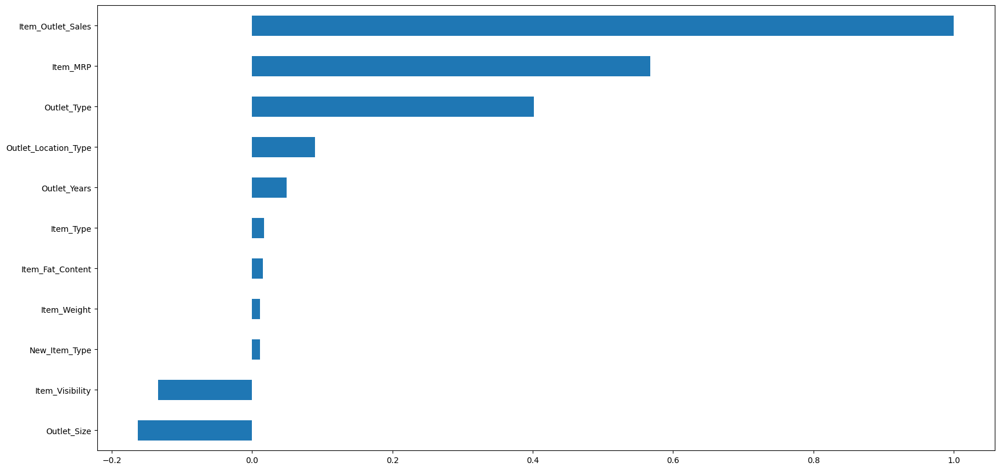

In [ ]:
# Target Variable's correlation
encoded_df_sk.corr()[target_var].sort_values().plot(kind="barh", figsize=(20,10))

<Axes: >

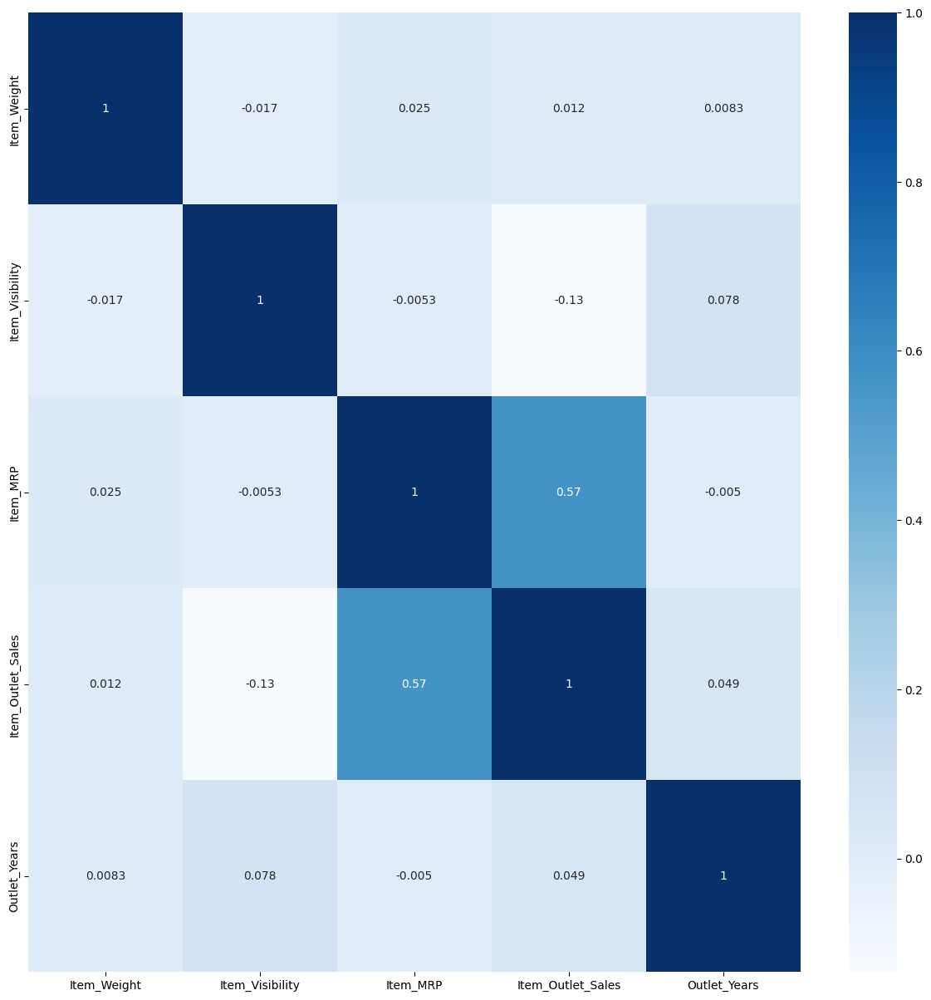

In [ ]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(), annot=True, cmap='Blues')

<Axes: >

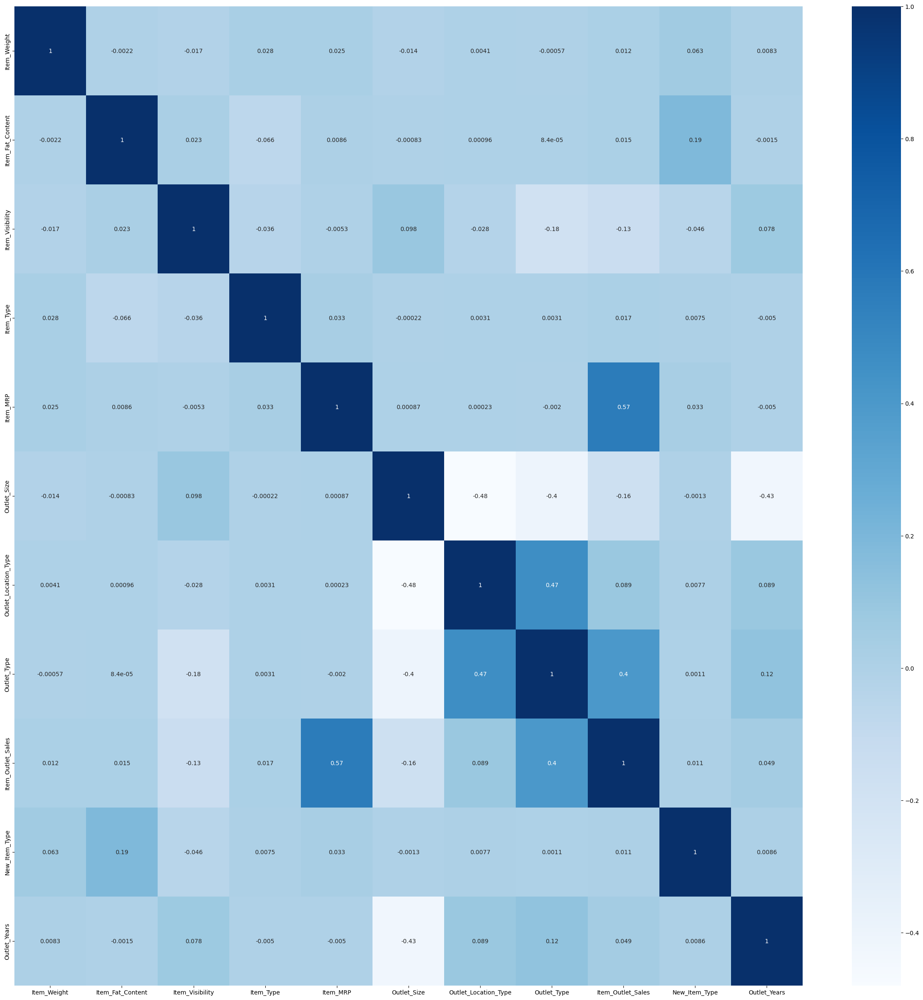

In [ ]:
plt.figure(figsize=(30,30))
sns.heatmap(encoded_df.corr(), annot=True, cmap='Blues')

<Axes: >

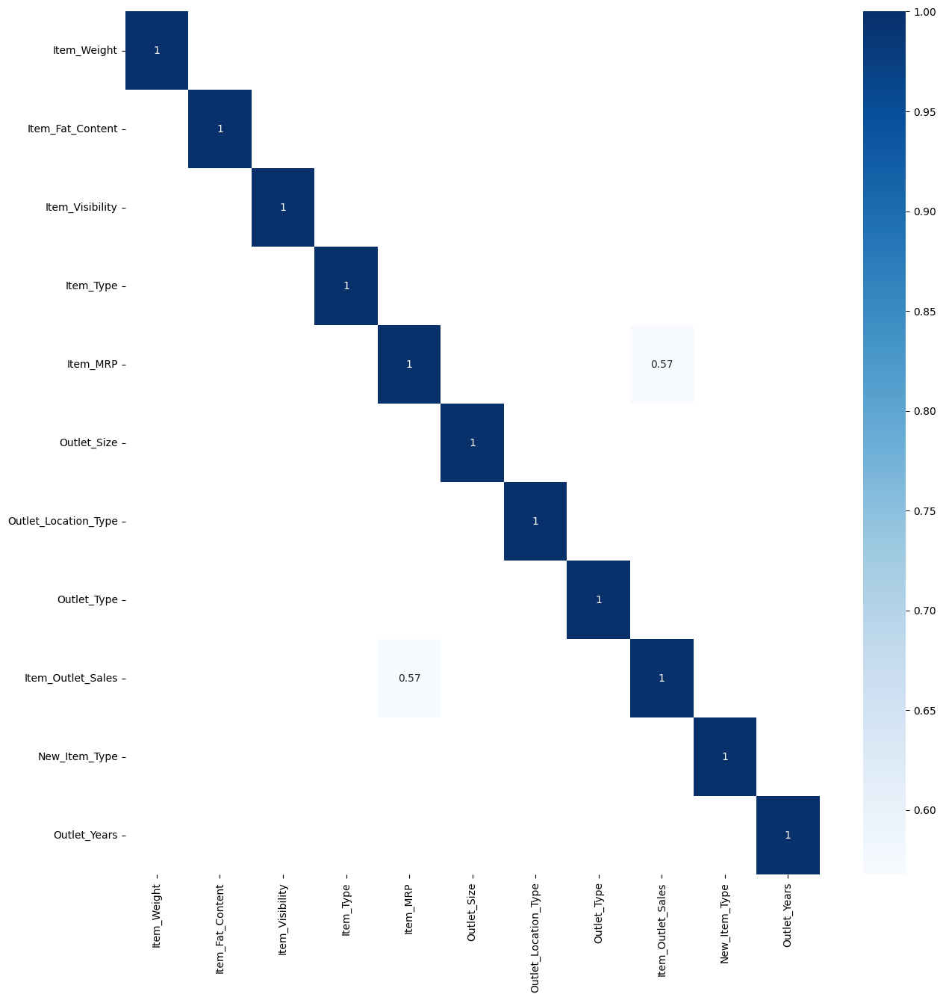

In [ ]:
plt.figure(figsize=(15,15))
th = 0.5
sns.heatmap(encoded_df.corr()[encoded_df.corr() > th], annot=True, cmap='Blues')

<Axes: >

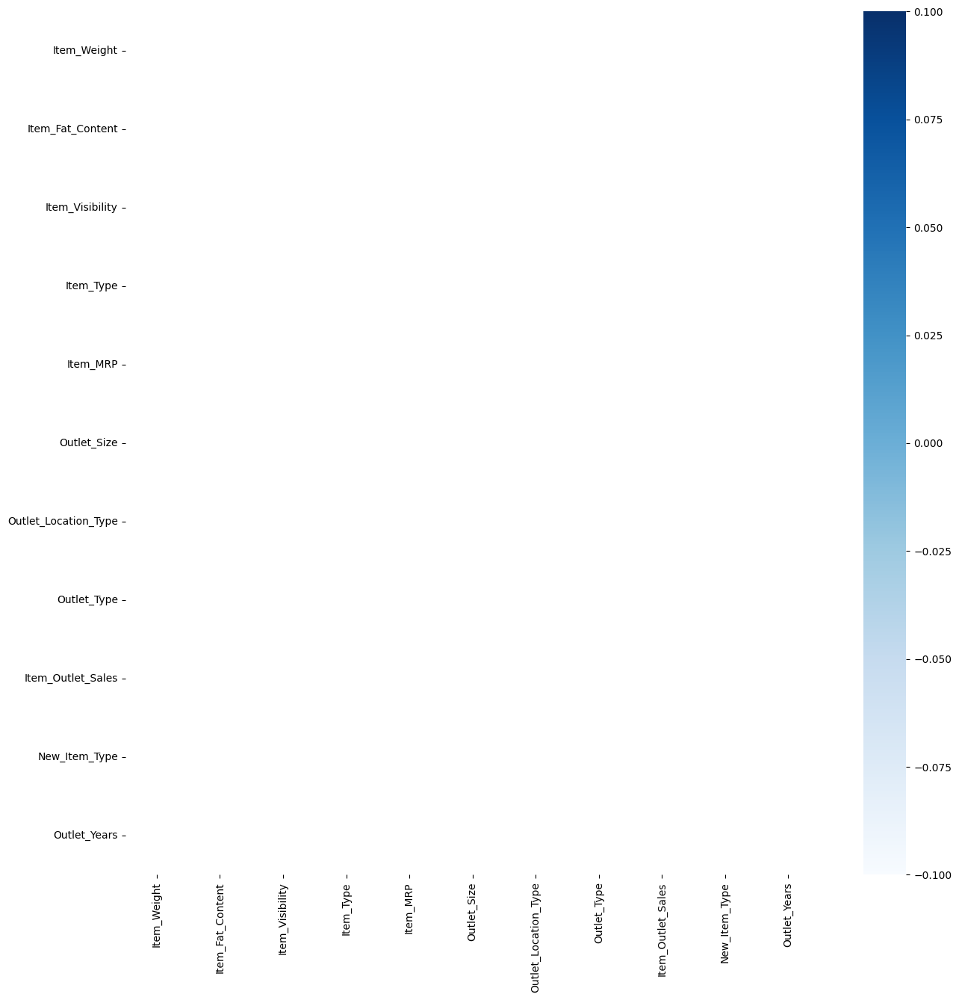

In [ ]:
plt.figure(figsize=(15,15))
th = -0.5
sns.heatmap(encoded_df.corr()[encoded_df.corr() < th], annot=True, cmap='Blues')

### Variances

In [ ]:
import numpy as np
variance_per_var = np.round(df.var().sort_values(ascending=False), 2)
variance_per_var

Item_Outlet_Sales    2912140.94
Item_MRP                3878.18
Outlet_Years              70.09
Item_Weight               17.86
Item_Visibility            0.00
dtype: float64

In [ ]:
len(df["Item_Visibility"].unique())

7880

In [ ]:
df["Item_Visibility"].unique().size

7880

<Axes: xlabel='Item_Visibility', ylabel='Density'>

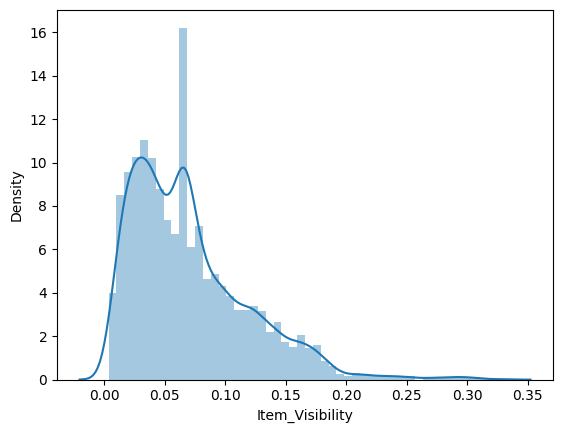

In [ ]:
sns.distplot(df["Item_Visibility"])

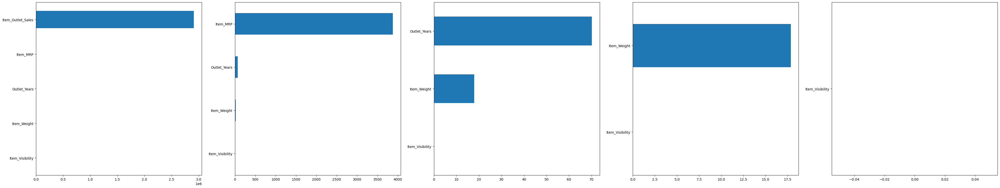

In [ ]:
size = len(variance_per_var.index)
rs,cs = (size//5+1, 5) if size >= 5 else  (size//3+1, 3)

plt.figure(figsize=(cs*10, rs*10))
for i, col_name in enumerate(variance_per_var.index):
  plt.subplot(rs, cs, i+1)
  variance_per_var[col_name:].sort_values(ascending=True).plot.barh();

In [ ]:
encoded_df.var().sort_values(ascending=False).round(2)

Item_Outlet_Sales       2912140.94
Item_MRP                   3878.18
Outlet_Years                 70.09
Item_Weight                  17.86
Item_Type                    17.72
Item_Fat_Content              0.80
Outlet_Location_Type          0.66
Outlet_Type                   0.63
Outlet_Size                   0.47
New_Item_Type                 0.27
Item_Visibility               0.00
dtype: float64

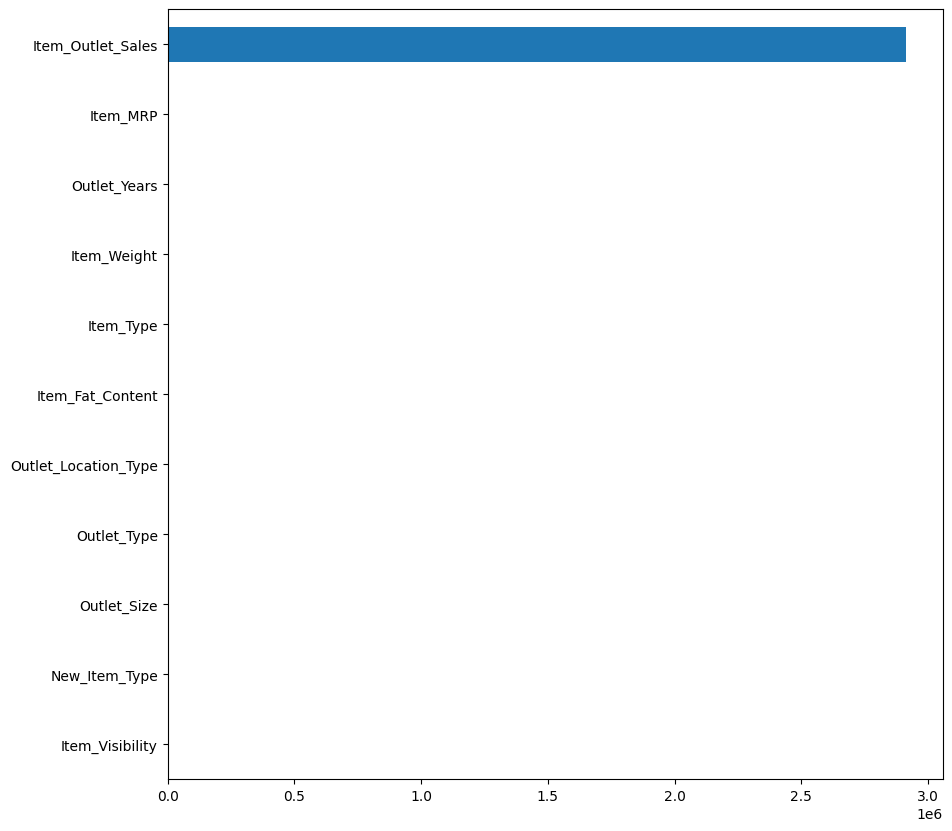

In [ ]:
plt.figure(figsize=(10, 10))
encoded_df.var().sort_values(ascending=True).plot.barh();

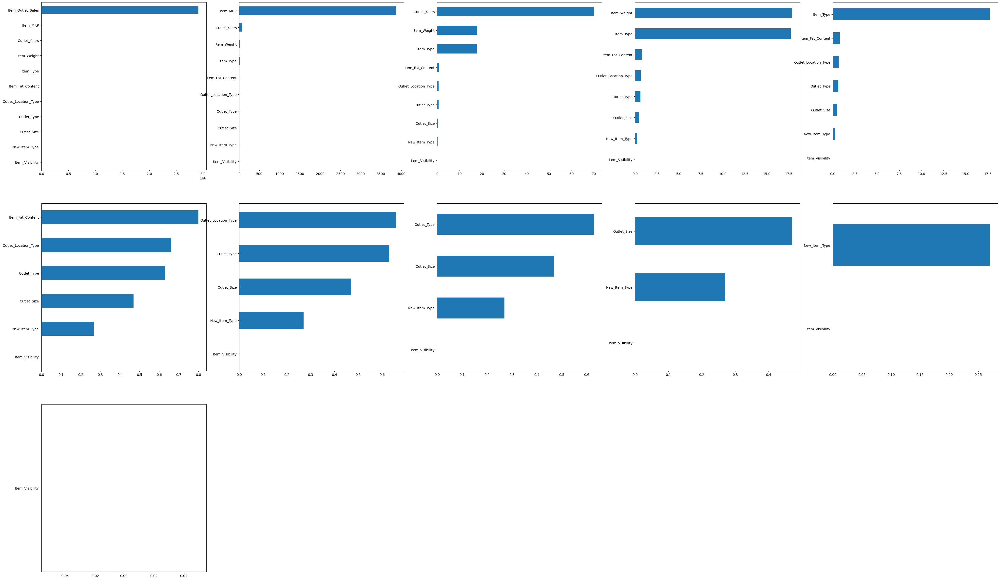

In [ ]:
variance_per_var_enc = np.round(encoded_df.var().sort_values(ascending=False), 2)

size = len(variance_per_var_enc.index)
rs,cs = (size//5+1, 5) if size >= 5 else  (size//3+1, 3)

plt.figure(figsize=(cs*10, rs*10))
for i, col_name in enumerate(variance_per_var_enc.index):
  plt.subplot(rs, cs, i+1)
  variance_per_var_enc[col_name:].sort_values(ascending=True).plot.barh();

### Covariance between target var

#### Way-1

In [ ]:
def numerical_covariance(df, target_var):
    # Separate out numerical columns
    numerical_cols = df.select_dtypes(include=[int, float, "int8", bool]).columns

    # Create a copy of the DataFrame with only the numerical columns
    numerical_df = df[numerical_cols].copy()

    # If the target variable is categorical, encode it temporarily
    if df[target_var].dtype == 'object' or df[target_var].dtype == 'category':
        temp_encode = pd.get_dummies(df[target_var], prefix=target_var)
        numerical_df = pd.concat([numerical_df, temp_encode], axis=1)
        target_var = temp_encode.columns[0]

    # Calculate the covariance between each numerical column and the target variable
    covariances = numerical_df.cov()[target_var]

    # Return the result as a pandas Series
    return covariances

In [ ]:
covariances = np.round(numerical_covariance(df, target_var),2)
covariances

Item_Weight               83.30
Item_Visibility          -11.16
Item_MRP               60317.49
Item_Outlet_Sales    2912140.94
Outlet_Years             701.96
Name: Item_Outlet_Sales, dtype: float64

<Axes: >

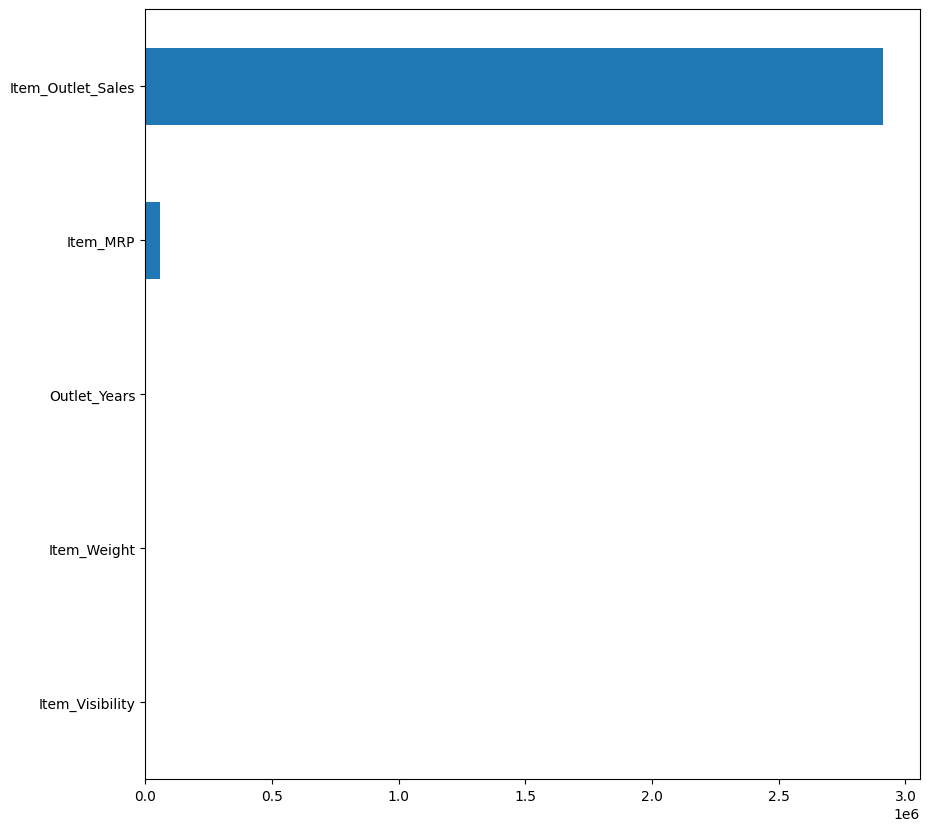

In [ ]:
plt.figure(figsize=(10, 10))
covariances.sort_values(ascending=True).plot.barh()

<Axes: >

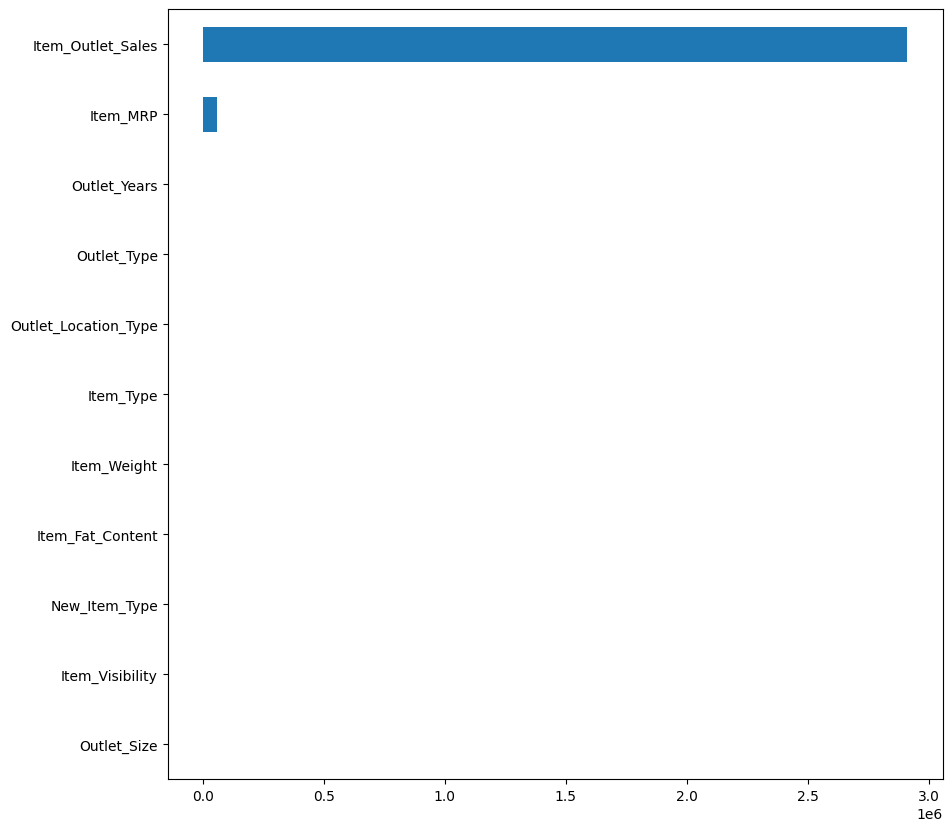

In [ ]:
plt.figure(figsize=(10, 10))
numerical_covariance(encoded_df, target_var).sort_values(ascending=True).plot.barh()

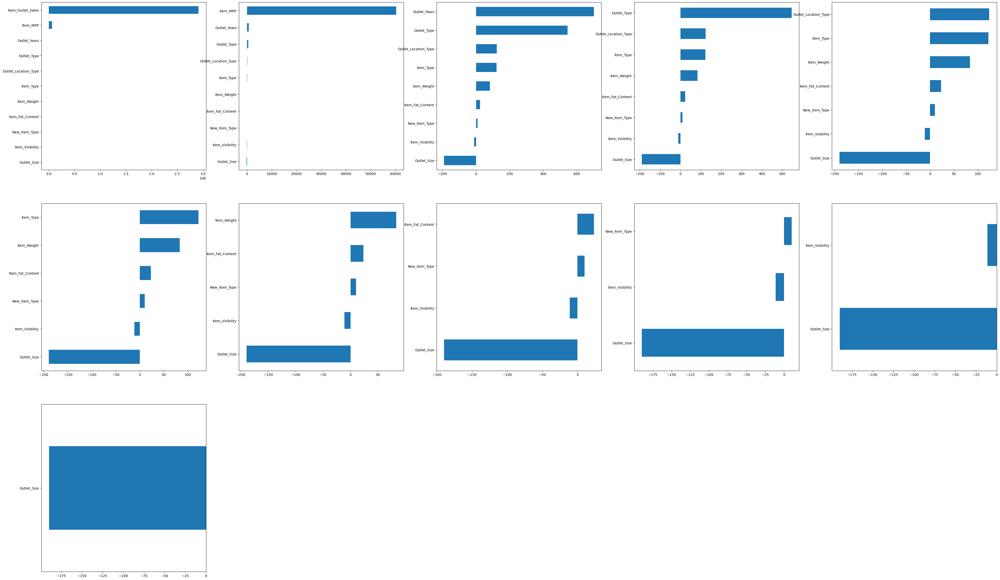

In [ ]:
cov_target = numerical_covariance(encoded_df, target_var).sort_values(ascending=False)

size = len(cov_target.index)
rs,cs = (size//5+1, 5) if size >= 5 else  (size//3+1, 3)

plt.figure(figsize=(cs*10, rs*10))
for i, col_name in enumerate(cov_target.index):
  plt.subplot(rs, cs, i+1)
  cov_target[col_name:].sort_values(ascending=True).plot.barh()

In [ ]:

plt.figure(figsize=(10, 10))


<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

#### Way-2
```python
# Calculate the covariance between the target and the feature
cov = {  col: [ np.cov(df[target_var].cat.codes, df[col])[0,1] ] for col in num_cols }
cov_s = pd.Series(np.squeeze(list(cov.values())), index=cov.keys())
cov_s
```

## Bivariate & Multivariate Analysis

In [ ]:
num_cols

Index(['Item_Weight', 'Item_Visibility', 'Item_MRP', 'Item_Outlet_Sales',
       'Outlet_Years'],
      dtype='object')

In [ ]:
cat_cols

Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Size', 'Outlet_Location_Type',
       'Outlet_Type', 'New_Item_Type'],
      dtype='object')

In [ ]:
len(df.columns) == (len(num_cols) + len(cat_cols))

True

In [ ]:
encoded_df.columns

Index(['Item_Weight', 'Item_Fat_Content', 'Item_Visibility', 'Item_Type',
       'Item_MRP', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type',
       'Item_Outlet_Sales', 'New_Item_Type', 'Outlet_Years'],
      dtype='object')

In [ ]:
target_sorted_corrs = encoded_df.corr()[target_var].drop(target_var).sort_values(ascending=False)
target_sorted_corrs

Item_MRP                0.567574
Outlet_Type             0.401522
Outlet_Location_Type    0.089367
Outlet_Years            0.049135
Item_Type               0.017048
Item_Fat_Content        0.015249
Item_Weight             0.011550
New_Item_Type           0.011236
Item_Visibility        -0.134138
Outlet_Size            -0.162753
Name: Item_Outlet_Sales, dtype: float64

<Axes: >

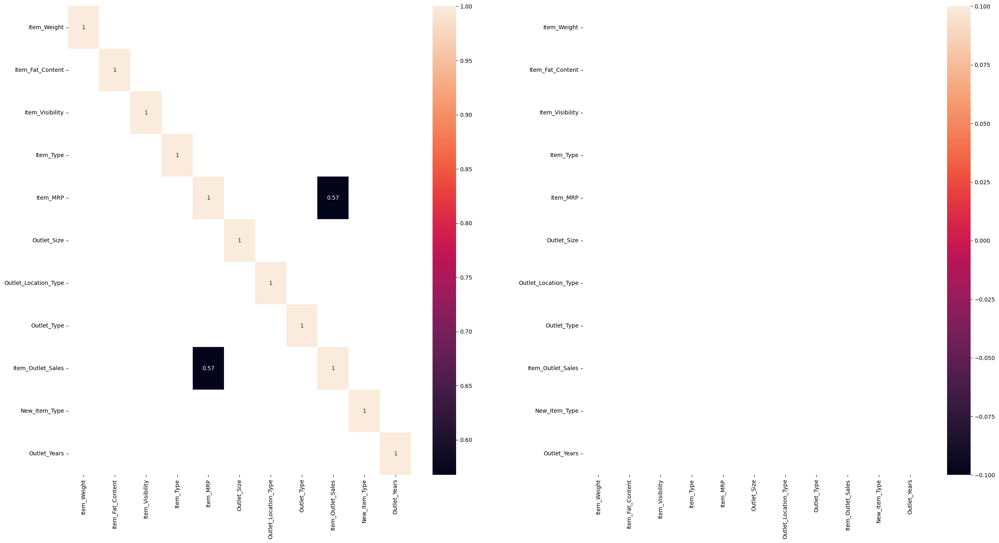

In [ ]:
tmp_corrs = encoded_df.corr()

plt.figure(figsize=(30,15))

plt.subplot(1,2,1)
sns.heatmap(tmp_corrs[tmp_corrs>0.5], annot=True)

plt.subplot(1,2,2)
sns.heatmap(tmp_corrs[tmp_corrs < -0.5], annot=True)

<Axes: >

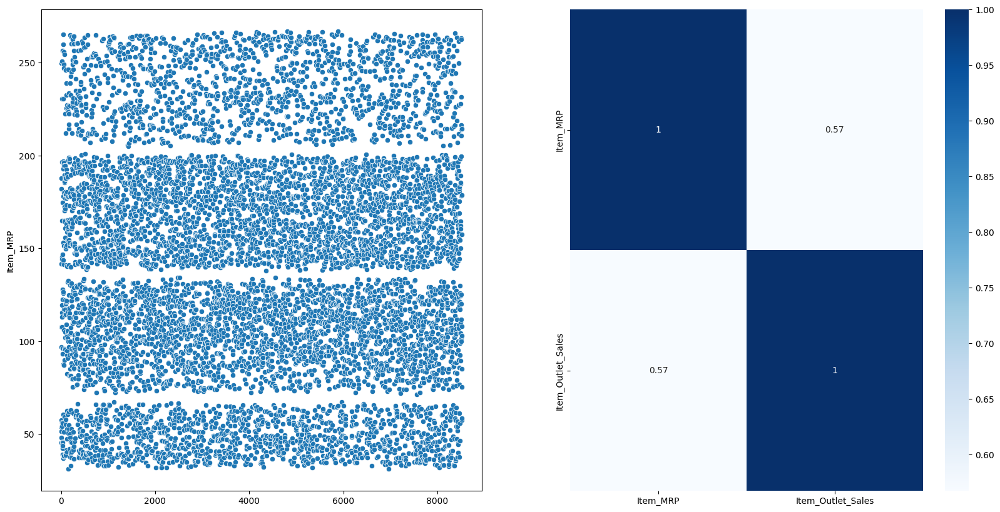

In [ ]:
plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
sns.scatterplot(df[target_sorted_corrs.index[0]]) # ,df[target_var]

plt.subplot(1,2,2)
tmp_corr=df[[target_sorted_corrs.index[0], target_var]].corr()
sns.heatmap(tmp_corr, annot=True,cmap='Blues')

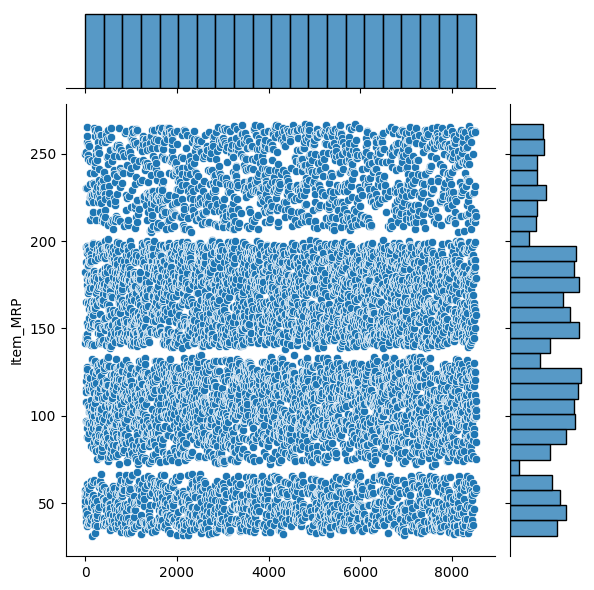

In [ ]:
sns.JointGrid(df[target_sorted_corrs.index[0]]).plot(sns.scatterplot, sns.histplot); #  df[target_var]

<Axes: >

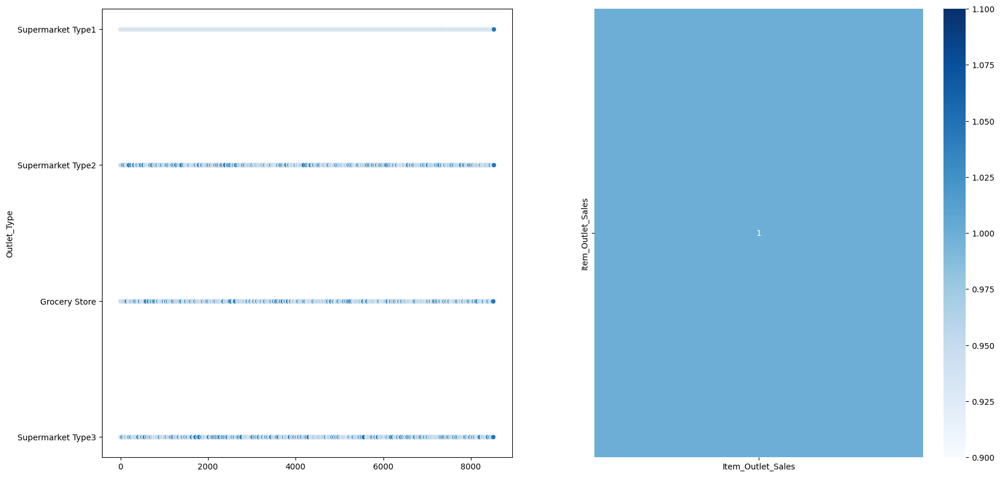

In [ ]:
plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
sns.scatterplot(df[target_sorted_corrs.index[1]]) # , df[target_var]

plt.subplot(1,2,2)
tmp_corr=df[[target_sorted_corrs.index[1], target_var]].corr()
sns.heatmap(tmp_corr, annot=True,cmap='Blues')

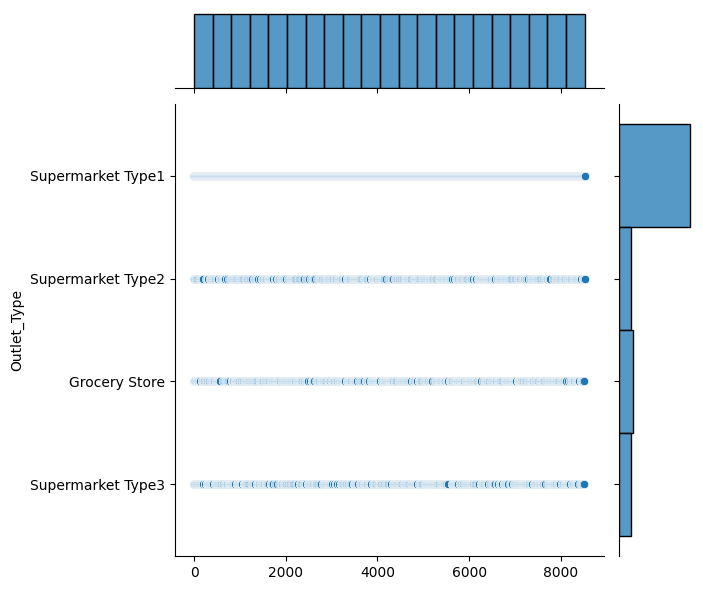

In [ ]:
sns.JointGrid(df[target_sorted_corrs.index[1]]).plot(sns.scatterplot, sns.histplot); # ,  df[target_var]

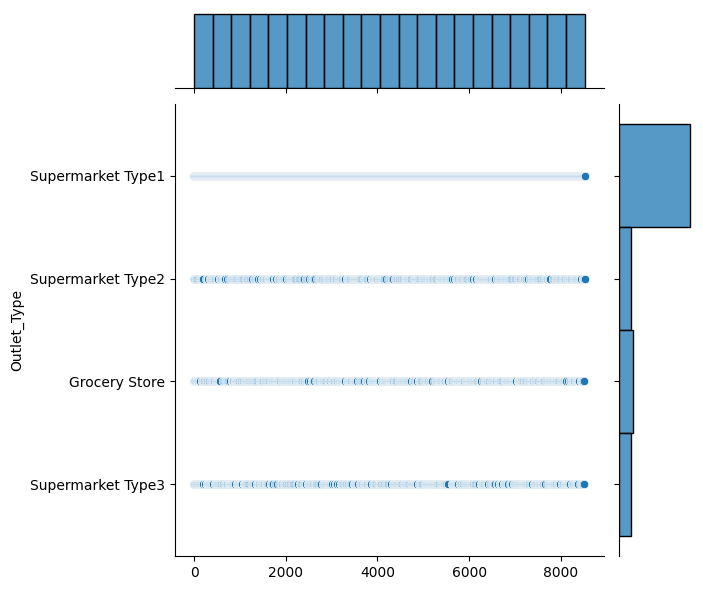

In [ ]:
sns.JointGrid(df[target_sorted_corrs.index[1]]).plot(sns.scatterplot, sns.histplot); # , df[target_var]

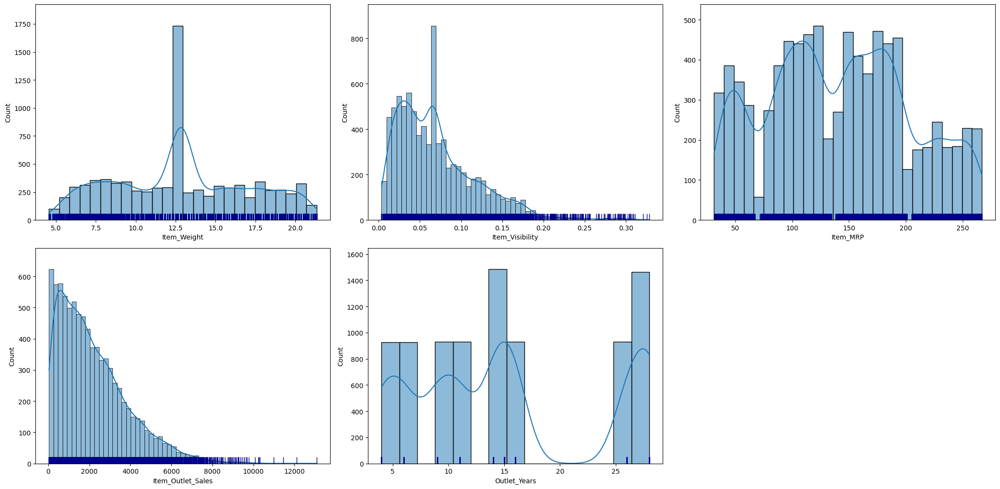

In [ ]:
fig = plt.figure( figsize=figsize)
for i, col in enumerate(num_cols):
    ax=fig.add_subplot(rows,cols,i+1)
    sns.histplot(x=df[col], data=df, kde=True, ax=ax) #  hue=df[target_var],
    sns.rugplot(x=df[col], data=df,  height=.03, color='darkblue', ax=ax) # hue=df[target_var],
    
fig.tight_layout()  
plt.show()

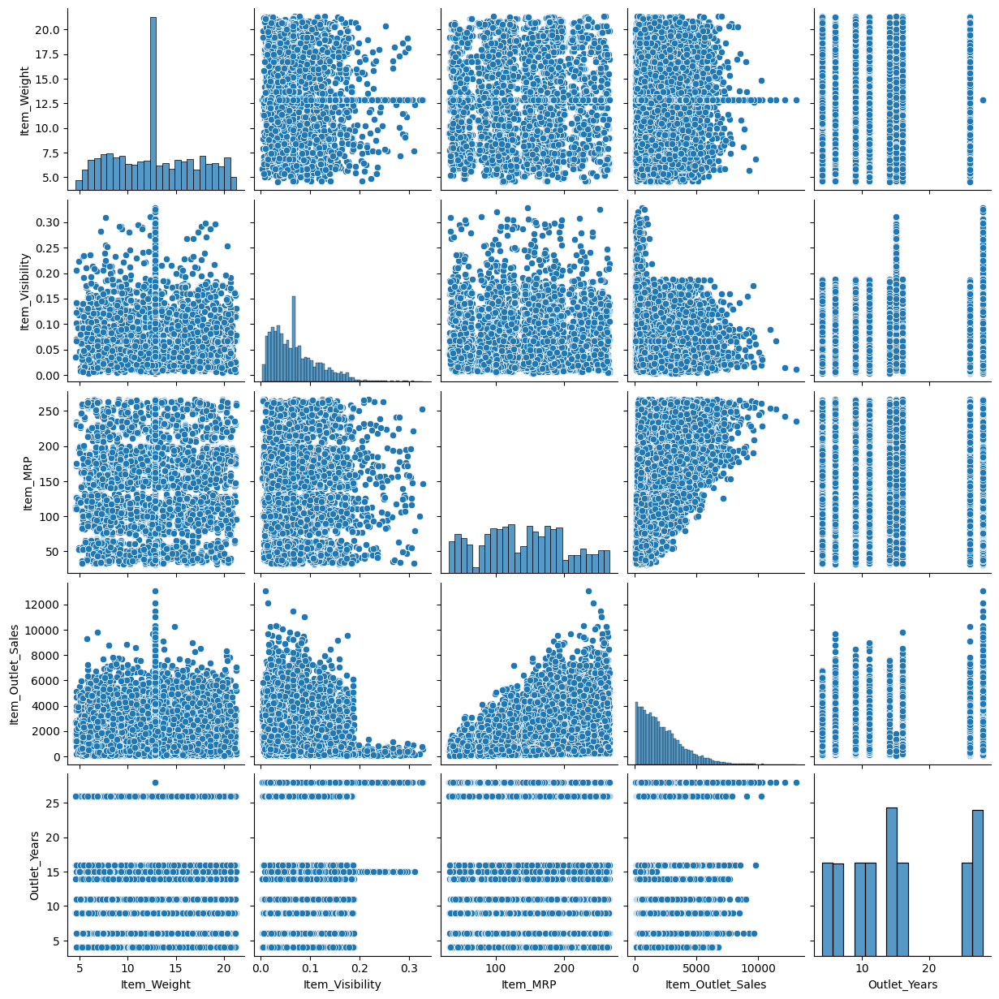

In [ ]:
sns.pairplot(df[num_cols]);
# sns.pairplot(df[num_cols], hue=target_var);

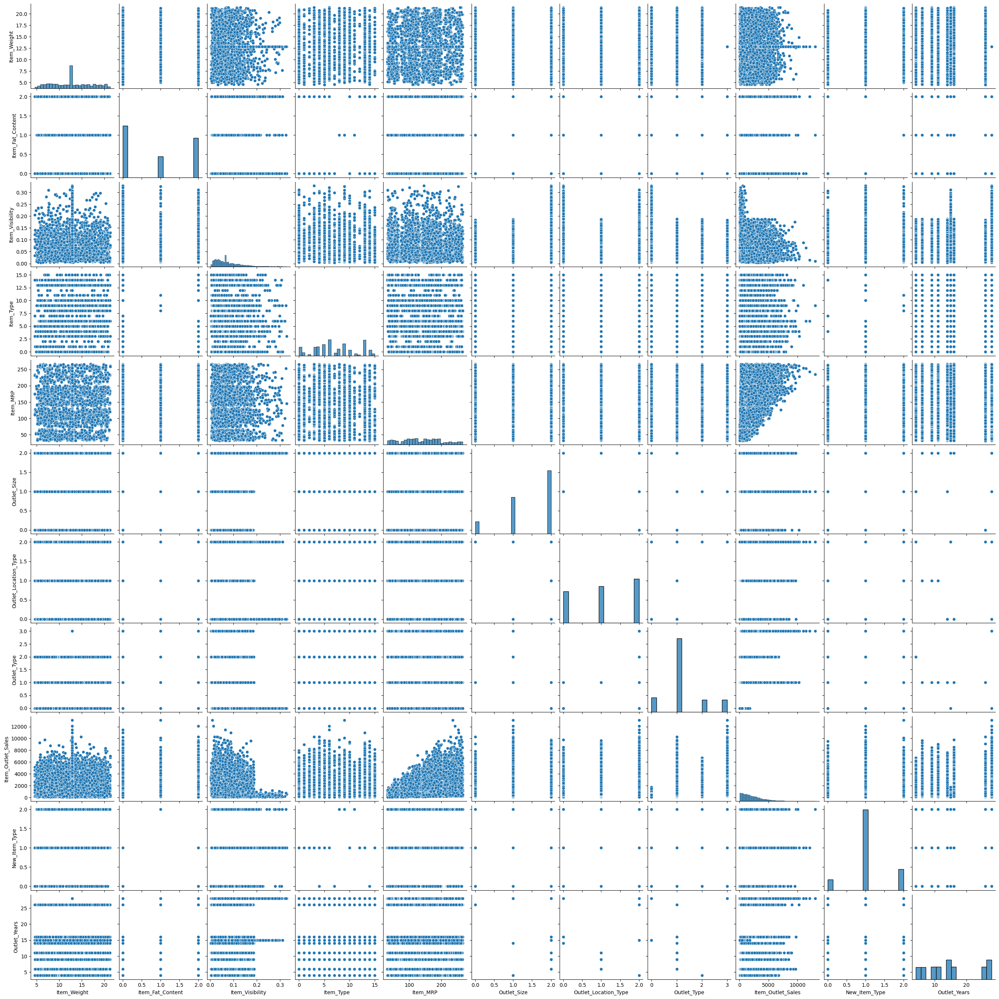

In [ ]:
sns.pairplot(encoded_df);
# sns.pairplot(encoded_df, hue=target_var);

<Figure size 2000x2000 with 0 Axes>

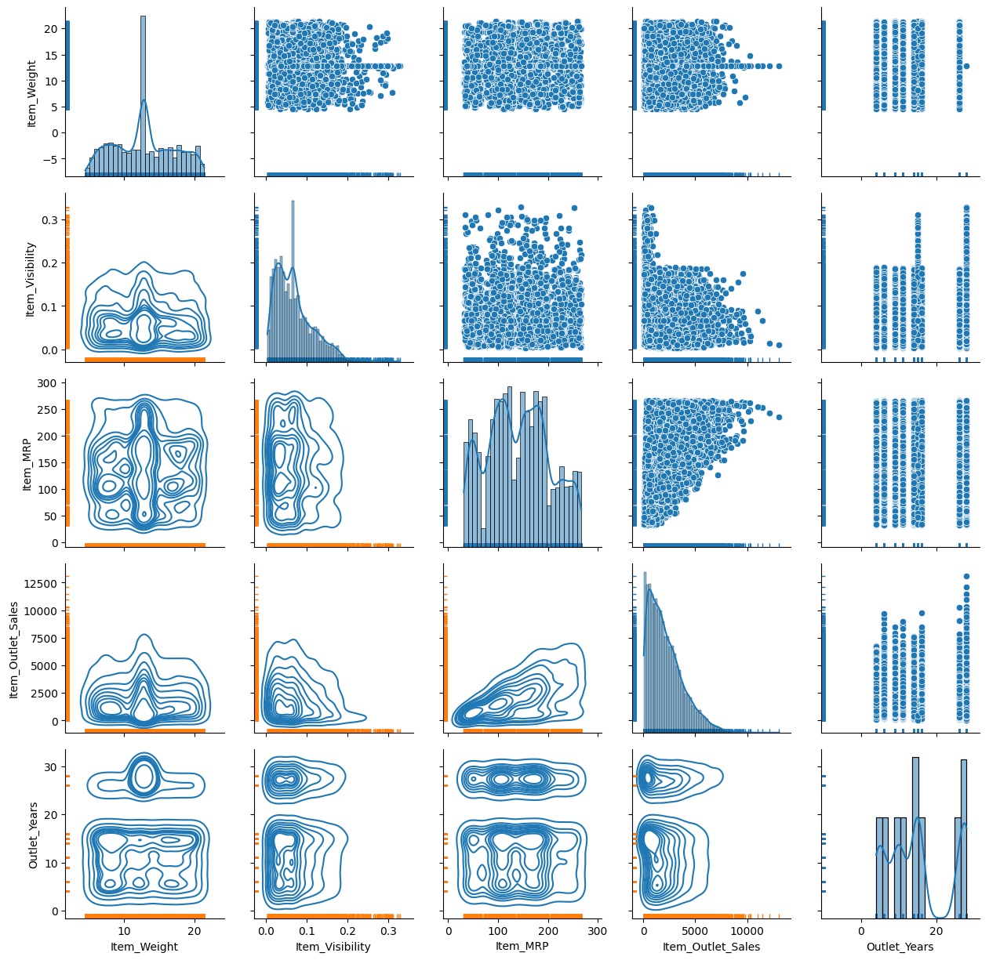

In [ ]:
plt.figure(figsize=(20,20))

# Create a PairGrid instance
g = sns.PairGrid(df.select_dtypes(exclude=[bool]), diag_sharey=False) # hue=target_var
g.map_upper(sns.scatterplot)
g.map_diag(sns.histplot, kde=True)
g.map_lower(sns.kdeplot)
g.map(sns.rugplot);
g.add_legend();

<Figure size 2000x2000 with 0 Axes>

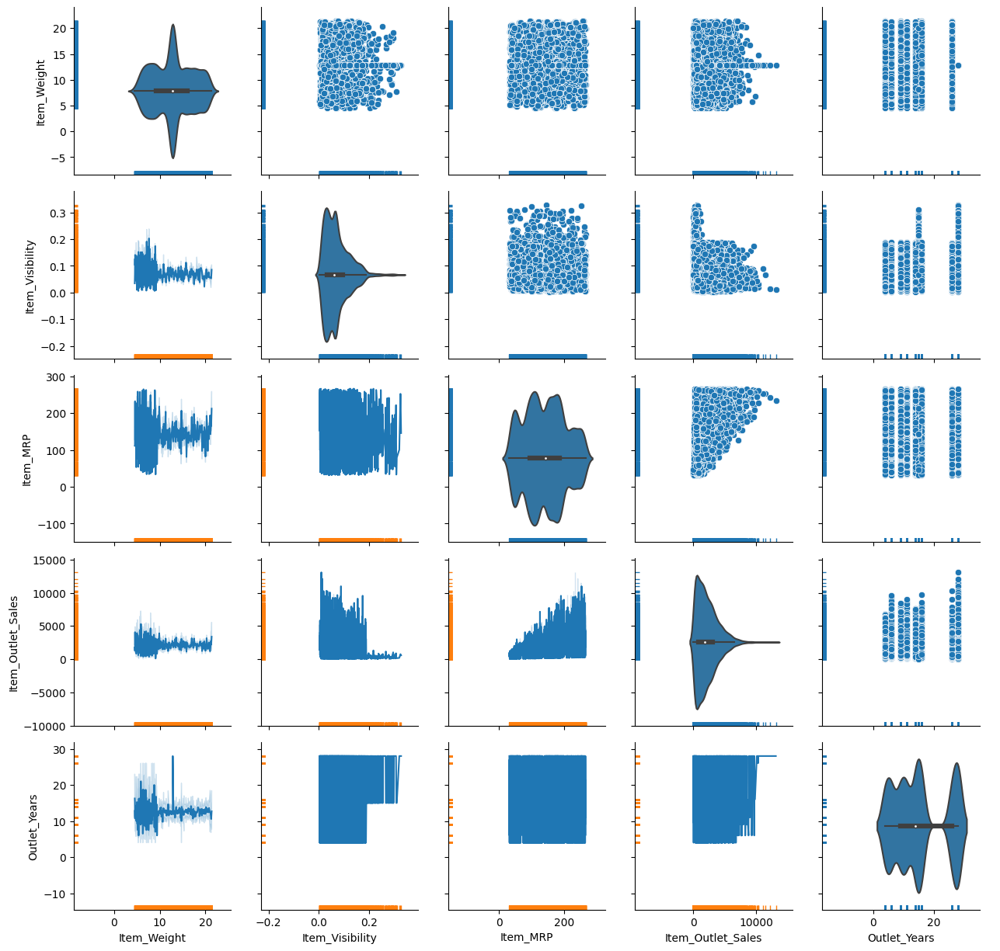

In [ ]:
plt.figure(figsize=(20,20))

# Create a PairGrid instance
g = sns.PairGrid(df.select_dtypes(exclude=[bool]), diag_sharey=False) # , hue=target_var
g.map_upper(sns.scatterplot)
g.map_diag(sns.violinplot)
g.map_lower(sns.lineplot)
g.map(sns.rugplot)
g.add_legend();

<Figure size 2000x2000 with 0 Axes>

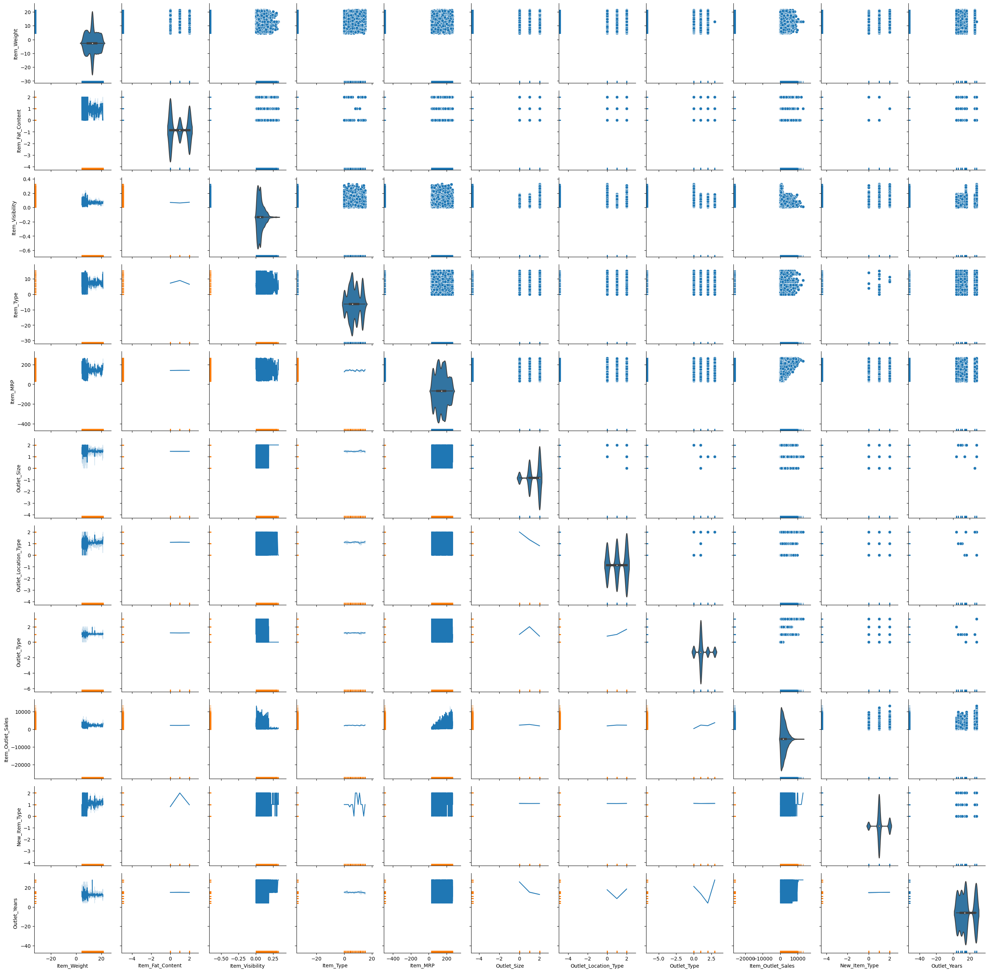

In [ ]:
plt.figure(figsize=(20,20))

# Create a PairGrid instance
g = sns.PairGrid(encoded_df) # ,  hue=target_var
g.map_upper(sns.scatterplot)
g.map_diag(sns.violinplot)
g.map_lower(sns.lineplot)
g.map(sns.rugplot)
g.add_legend();

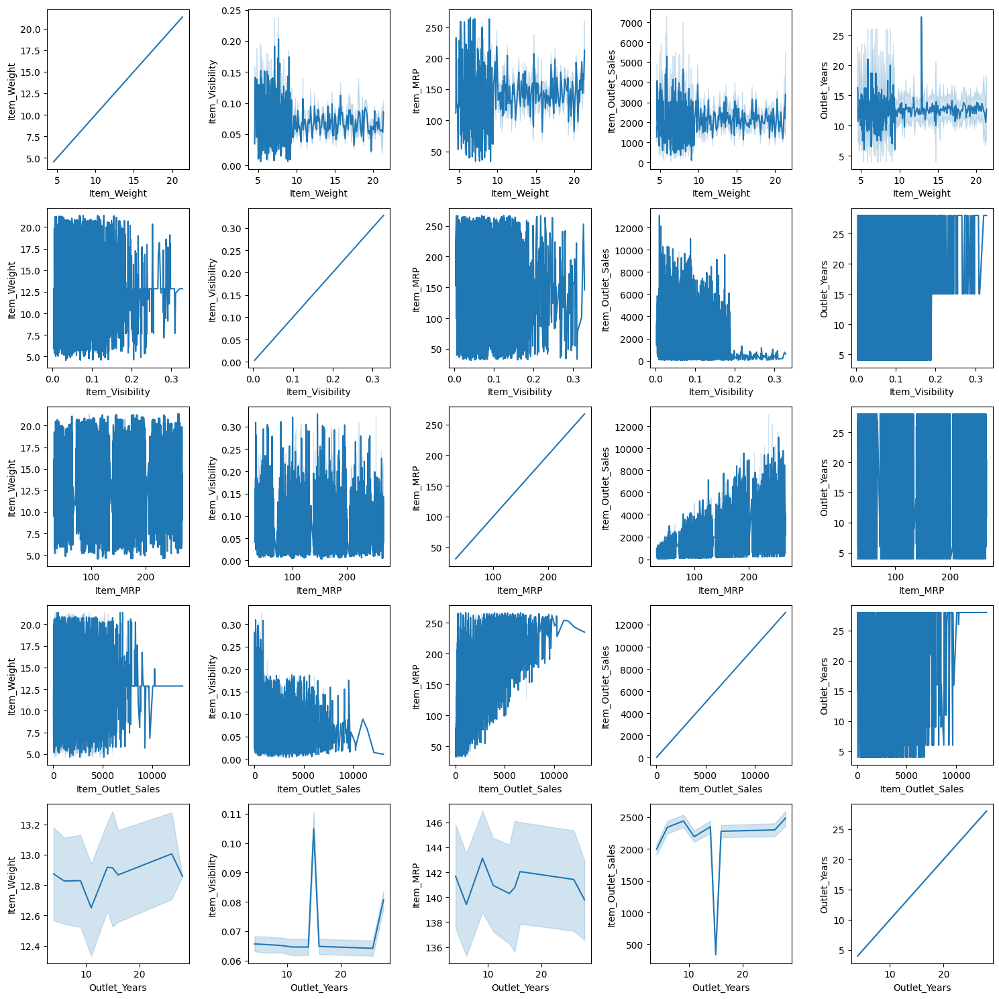

In [ ]:
row_size, col_size = len(num_cols), len(num_cols)
fig = plt.figure( figsize=(row_size*3, row_size*3))
for i, row in enumerate(num_cols):
    for j, col in enumerate(num_cols):
        ax=fig.add_subplot(row_size, col_size, (i*col_size)+j+1)
        sns.lineplot(data= df, x=row, y=col, ax=ax) # hue=target_var,
        
fig.tight_layout()  
plt.show()

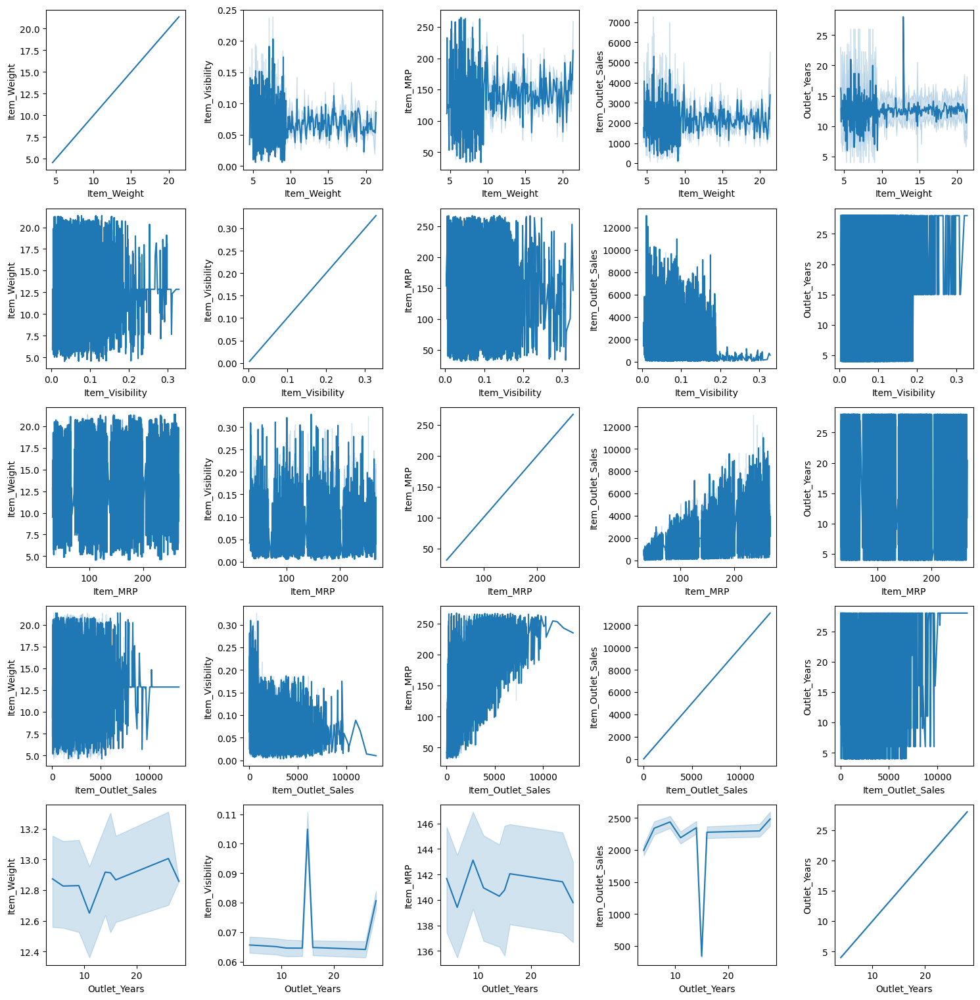

In [ ]:
row_size = col_size = len(encoded_df.columns)
fig = plt.figure( figsize=(row_size*3, row_size*3))
for i, row in enumerate(num_cols):
    for j, col in enumerate(num_cols):
        ax=fig.add_subplot(row_size, col_size, (i*col_size)+j+1)
        sns.lineplot(data= encoded_df, x=row, y=col, ax=ax) #  hue=target_var,
        
fig.tight_layout()  
plt.show()

# (E) Model Selection (Classic ML models)

#### Utils

In [ ]:
from sklearn.metrics import classification_report

def print_clf_reports(best_clfs, original_X_test, original_y_test, labels = ['No Fraud', 'Fraud']):
  for name, model in  best_clfs.items():
  
    preds = model.predict(original_X_test)

    print("*"*50, end="\n"*3)
    print(f"{name:<0.15} Classification Results")
    print(classification_report(original_y_test, preds, target_names=labels))
    print("*"*50, end="\n"*3)


In [ ]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import learning_curve

def plot_learning_curve(model, name, X, y, ylim=None, cv=None, n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5), figsize=(20,20)):

    # checking the params
    if ylim is not None: plt.ylim(*ylim)
    
    # pre-declerations
    orange, blue = "#ff9124", "#2492ff"

    # Extracting the learning curve
    train_sizes, train_scores, test_scores = learning_curve(
        model, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    
    # Extracting the scores
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    # calculating params    
    tra_left_edge = train_scores_mean - train_scores_std
    tra_right_edge = train_scores_mean + train_scores_std

    test_left_edge = test_scores_mean - test_scores_std
    test_right_edge = test_scores_mean + test_scores_std

    # transparent plot for confidence value range
    plt.fill_between(train_sizes, tra_left_edge, tra_right_edge, alpha=0.1, color=orange)
    plt.fill_between(train_sizes, test_left_edge, test_right_edge, alpha=0.1, color=blue)
    
    # Plotting as point
    plt.plot(train_sizes, train_scores_mean, 'o-', color=orange, label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color=blue, label="Cross-validation score")
    
    # Configurating the plottings
    plt.title(f"{name} Learning Curve", fontsize=14)
    plt.xlabel('Training size (m)')
    plt.ylabel('Score')
    plt.grid(True)
    plt.legend(loc="best")

In [ ]:
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.neighbors import KNeighborsClassifier

def get_learning_curve_stats(clfs, X_train, y_train, cv, model_size, rs, cs, figsize, ylim):

  plt.figure(figsize=figsize)
  # EXtracting the learning curve and validation metrics
  best_models_cross_val_preds, roc_auc_scores = {}, {}
  for i, (name, model) in enumerate(clfs.items()):

    # Training with best models again (the best params already saved inside) for visualizate the duration.
    plt.subplot(rs, cs, i+1)
    print(f"{i}.turn [{name}], plotting learning curve")
    plot_learning_curve(model, name, X_train, y_train, ylim, cv=cv, n_jobs=-1, figsize=figsize) 

    # validating the trained models
    #print(f"{i}.turn, cross_validation")
    #method = "decision_function" if name in ["loj_reg", "svc"] else "predict"
    #best_models_cross_val_preds[name]  = cross_val_predict(model, X_train, y_train, cv=5, method=method)

    # Displating the roc scores
    #print(f"{i}.turn, roc_auc_scores")
    #roc_auc_scores[name] = roc_auc_score(y_train, best_models_cross_val_preds[name])
    #print(f'{name:<20}: ',roc_auc_scores[name])

  return plt.gcf()#, best_models_cross_val_preds#, roc_auc_scores

```python
# Example Usage
model_size = len(us_models)
rs, cs = (model_size//2+1, 4 ) if model_size >= 4 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=100, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (40,20),
    "ylim" : (0.87, 1.01)
}

lc_plot, best_models_cross_val_preds, roc_auc_scores  = get_learning_curve_stats(us_models, figsize=(40,10), **lcs_params)
```

## Prepare The Data To Training

### Encoding the categorical variables

##### Label Encoding

In [ ]:
from sklearn.preprocessing import LabelEncoder

encoders = {}
encode_cols = ['Item_Fat_Content', 'Item_Type', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type', 'New_Item_Type']
# 'Outlet_Identifier'
for col in encode_cols:
  # creating encoder for current variable
  encoders[col]= LabelEncoder()

  # Label encoding
  df[col] = encoders[col].fit_transform(df[col])

In [ ]:
#test Encoding
encoders_df_test = {}
encode_cols = ['Item_Fat_Content', 'Item_Type', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type', 'New_Item_Type']
# 'Outlet_Identifier'
for col in encode_cols:
  # creating encoder for current variable
  encoders_df_test[col]= LabelEncoder()

  # Label encoding
  df_test[col] = encoders_df_test[col].fit_transform(df_test[col])

In [ ]:
df["Item_Type"].unique(), encoders['Item_Type'].inverse_transform(df["Item_Type"].unique())

(array([ 4, 14, 10,  6,  9,  0, 13,  5,  2,  8,  7,  3,  1, 15, 11, 12]),
 array(['Dairy', 'Soft Drinks', 'Meat', 'Fruits and Vegetables',
        'Household', 'Baking Goods', 'Snack Foods', 'Frozen Foods',
        'Breakfast', 'Health and Hygiene', 'Hard Drinks', 'Canned',
        'Breads', 'Starchy Foods', 'Others', 'Seafood'], dtype=object))

##### Onehot Encoding
```python
df.drop(columns=["Item_Type"], inplace=True)
```


```python
one_hot_encoding_cols = ['Item_Fat_Content', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type', 'New_Item_Type']
df = pd.get_dummies(df, columns=one_hot_encoding_cols)
df.head()
```
```python
one_hot_encoding_cols = ['Item_Fat_Content', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type', 'New_Item_Type']
df_test = pd.get_dummies(df_test, columns=one_hot_encoding_cols)
df_test.head()
```

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Item_Weight           8523 non-null   float64
 1   Item_Fat_Content      8523 non-null   int64  
 2   Item_Visibility       8523 non-null   float64
 3   Item_Type             8523 non-null   int64  
 4   Item_MRP              8523 non-null   float64
 5   Outlet_Size           8523 non-null   int64  
 6   Outlet_Location_Type  8523 non-null   int64  
 7   Outlet_Type           8523 non-null   int64  
 8   Item_Outlet_Sales     8523 non-null   float64
 9   New_Item_Type         8523 non-null   int64  
 10  Outlet_Years          8523 non-null   int64  
dtypes: float64(4), int64(7)
memory usage: 732.6 KB


### Splitting the dataset
```python
# train, test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

# train, validation split
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.20)
```

In [ ]:
#X = df.drop(columns=target_var)
#y = df[target_var]

# ['Outlet_Establishment_Year', 'Item_Identifier', 'Outlet_Identifier']

X = df.drop(columns=["Item_Outlet_Sales"])
y = df['Item_Outlet_Sales']

#### Train-Test Split

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

## Util Functions
- Utils functions for model tuning

### Greedy Step tune

In [ ]:
from sklearn.model_selection import GridSearchCV
from pprint import pprint

def greedy_search(model, params:dict, X_train, y_train, cv=10, n_jobs=-1, verbose=2, is_print=False):
  """It tunes params individually step by step . select best value on current step.
  It assumes the params sorted by importance on the model as descending. 
  The important param, second important param, etc.... 
  """
  
  best_params = {}
  for name, values in params.items():
    # Initial params
    best_params[name] = values

    if is_print: print("before:");pprint(best_params);
    
    # create GridSearch&Train 
    cv_model = GridSearchCV(model, best_params, cv=cv, n_jobs=n_jobs, verbose=verbose)
    cv_model.fit(X_train, y_train)

    # Update the param
    best_params[name] = [cv_model.best_params_[name]]
    
    if is_print: print("after:");pprint(best_params);print("-"*25, end="\n\n");

  return cv_model, cv_model.best_estimator_, best_params

### Model Tuner

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report


def gen_clf_metrics(y_test, y_pred, is_round, return_y_data=False):
  """
  Calculate and return a dictionary of common classification metrics.
  """

  if is_round: y_pred = np.round(y_pred).astype(np.int64)

  clf_metrics = {
            "accuracy":accuracy_score(y_test, y_pred),
            "precision" : precision_score(y_test, y_pred, average="micro"),
            "recall": recall_score(y_test, y_pred, average="micro"),
            "f1_score": f1_score(y_test, y_pred, average="micro"),
            "clf_report":classification_report(y_test, y_pred, output_dict=True)
  }

  if return_y_data:
    clf_metrics["y_pred"] = y_pred
    clf_metrics["y_test"] = y_test
            
  
  return clf_metrics

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score, mean_absolute_error, median_absolute_error

def gen_reg_metrics(y_test, y_pred, is_round, return_y_data=False):
  """
  Calculate and return a dictionary of common regression metrics.
  """

  if is_round: y_pred = np.round(y_pred).astype(np.int64)


  reg_metrics = {
      "MaxError": np.max(y_test - y_pred),
      "MeanAbsoluteError": median_absolute_error(y_test, y_pred),
      "MeanAbsolutePercentageError": np.mean(np.abs((y_test - y_pred) / y_test)) * 100,
      "MSE": mean_squared_error(y_test, y_pred),
      "RMSE": mean_squared_error(y_test, y_pred, squared=False),
      "MAE": mean_absolute_error(y_test, y_pred),
      "R2":r2_score(y_test, y_pred),
      "ExplainedVariance":explained_variance_score(y_test, y_pred)
  }

  if return_y_data:
    reg_metrics["y_pred"] = y_pred
    reg_metrics["y_test"] = y_test


  return reg_metrics

In [ ]:
import pandas as pd
def tune_models(tuners, X_train, y_train, X_test, y_test, is_clf, cv=10, is_round=False, return_y_data=False):
  
  results, metric_summary = dict(), dict()
  for name, [model, params] in tuners.items():
    # Tuning
    cv_model, tuned_model, best_params = greedy_search(model, params, X_train, y_train, cv=cv)
    
    # predicting
    y_pred = tuned_model.predict(X_test)
    metric_kwargs = {"y_test":y_test, "y_pred":y_pred, "is_round":is_round, "return_y_data":return_y_data} 
    metric_results = gen_clf_metrics(**metric_kwargs) if is_clf else gen_reg_metrics(**metric_kwargs)

    # Generating results
    cur_results = {
        "tune_results": {
            "cv_model":cv_model,
            "tuned_model":tuned_model,
            "best_params":best_params,
        },
        "metric_results": metric_results
    }
    
    results[name] = cur_results
    metric_summary[name] = metric_results

  return results, pd.DataFrame(metric_summary).T


In [ ]:
import pandas as pd
def tune_linear_cv_models(tuners, X_train, y_train, X_test, y_test, is_clf, is_round=False, return_y_data=False):
  
  results, metric_summary = dict(), dict()
  for name, [model, params] in tuners.items():
      # Tuning
      tuned_model = model(**params)
      tuned_model.fit(X_train, y_train)
      
      # predicting
      y_pred = tuned_model.predict(X_test)
      metric_kwargs = {"y_test":y_test, "y_pred":y_pred, "is_round":is_round, "return_y_data":return_y_data} 
      metric_results = gen_clf_metrics(**metric_kwargs) if is_clf else gen_reg_metrics(**metric_kwargs)

      # Generating results
      cur_results = {
          "tune_results": {
              "tuned_model":tuned_model,
              "best_params":tuned_model.get_params(True) ,#best_params_,
          },
          "metric_results": metric_results
      }
      
      results[name] = cur_results
      metric_summary[name] = metric_results

  return results, pd.DataFrame(metric_summary).T

## (1) Linear Models

### Hyperparams

In [ ]:
lin_params = {
    'fit_intercept': [True, False],
    #'normalize': [True, False],
    'copy_X': [True, False],
}
from sklearn.linear_model import LinearRegression
linear_reg = [LinearRegression(), lin_params]

In [ ]:
lasso_params = {
    "alpha": np.logspace(-4, 0, 100).flatten(),
    #'tol': [1e-3, 1e-4],
    #'eps': [1e-2, 1e-3, 1e-4],
    #'fit_intercept': [True, False],
    #'normalize': [True, False],
    #'max_iter': [1000, 5000, 10000],
    'fit_intercept': [True, False],
    #'normalize': [True, False],
    'max_iter': [1000, 5000, 10000]
}

from sklearn.linear_model import Lasso, LassoCV
l1_reg = [Lasso(), lasso_params] 

In [ ]:
ridge_params = {
    "alpha": np.logspace(-4, 0, 100), #p.arange(0.00, 1.0, 0.01), #(10**np.linspace(10,-2,100))*0.5,
    #'normalize': [True, False],
    #'tol': [1e-4, 1e-3, 1e-2],
    'fit_intercept': [True, False],
    #'normalize': [True, False]
}

from sklearn.linear_model import Ridge, RidgeCV 
l2_reg = [Ridge(), ridge_params]

In [ ]:
ElasticNet_params = {
    "alpha": np.logspace(-4, 0, 100),
    'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9],
    'tol': [1e-4, 1e-3, 1e-2],
    'selection': ['cyclic', 'random'],    
    #'normalize': [True, False],
    'max_iter': [1000, 5000, 10000], 
}
from sklearn.linear_model import ElasticNet, ElasticNetCV 
enet_reg = [ElasticNet(), ElasticNet_params]

In [ ]:
linear_cv_tuners = {
    "l1_reg":l1_reg,
    
    "l2_reg":l2_reg,
    "enet_reg":enet_reg
}
linear_tuners = {
    "lin_reg":linear_reg,
    #**linear_cv_tuners
}

### Tuning Demostration

In [ ]:
lin_results, lin_metric_summary = tune_models(linear_cv_tuners, X_train, y_train, X_test, y_test, cv=10, is_clf=False, is_round=True)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Fitting 10 folds for each of 5 candidates, totalling 50 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits


In [ ]:
#lin_results, lin_metric_summary = tune_linear_cv_models(linear_cv_tuners, X_train, y_train, X_test, y_test, is_clf=False, is_round=True)

In [ ]:
list(lin_results.keys())

['l1_reg', 'l2_reg', 'enet_reg']

In [ ]:
lin_metric_summary

,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,MSE,RMSE,MAE,R2,ExplainedVariance
l1_reg,6325.649,710.2068,103.942886,1.415287e+06,1189.658286,907.207697,0.484579,0.484650
l2_reg,6326.649,712.2068,103.942175,1.415391e+06,1189.702037,907.254071,0.484541,0.484612
enet_reg,6326.649,712.7472,103.936455,1.415445e+06,1189.724800,907.272253,0.484521,0.484593


In [ ]:
from pprint import pprint
pprint(lin_results)

{'enet_reg': {'metric_results': {'ExplainedVariance': 0.48459281555299016,
                                 'MAE': 907.2722527859238,
                                 'MSE': 1415445.099082622,
                                 'MaxError': 6326.648999999999,
                                 'MeanAbsoluteError': 712.7472,
                                 'MeanAbsolutePercentageError': 103.93645483065448,
                                 'R2': 0.4845212352850514,
                                 'RMSE': 1189.7247997258114},
              'tune_results': {'best_params': {'alpha': [0.00021049041445120198],
                                               'l1_ratio': [0.5],
                                               'max_iter': [1000],
                                               'selection': ['random'],
                                               'tol': [0.0001]},
                               'cv_model': GridSearchCV(cv=10, estimator=ElasticNet(), n_jobs=-1,
             param_grid=

In [ ]:
#tuned_model
lin_results.keys()

dict_keys(['l1_reg', 'l2_reg', 'enet_reg'])

In [ ]:
lin_results["l1_reg"].keys()

dict_keys(['tune_results', 'metric_results'])

In [ ]:
lin_results["l1_reg"]["tune_results"].keys()

dict_keys(['cv_model', 'tuned_model', 'best_params'])

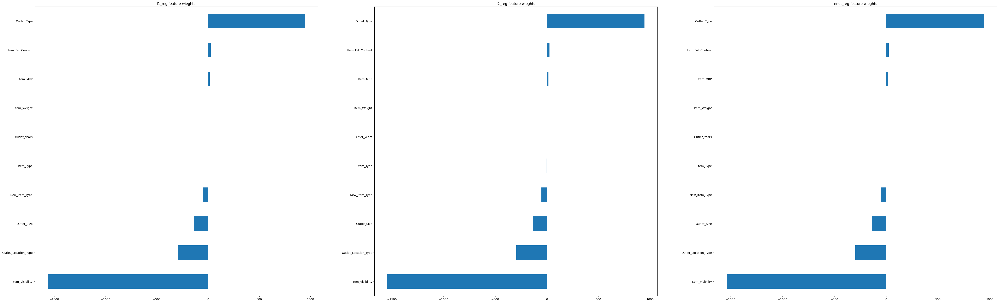

In [ ]:
size = len(lin_results.keys())
rs, cs = (size//5+1, 5) if size>=5 else (size//3+1, 3)

plt.figure(figsize=(cs*20, rs*20))
lin_models = {}
for i, model_name in enumerate(lin_results.keys()):

  cur_model = lin_results[model_name]["tune_results"]["tuned_model"]
  lin_models[model_name] = cur_model
  
  plt.subplot(rs,cs,i+1)
  pd.Series(cur_model.coef_, X_train.columns).sort_values().plot(kind="barh")
  plt.title(f"{model_name} feature wieghts")

0.turn [l1_reg], plotting learning curve
1.turn [l2_reg], plotting learning curve
2.turn [enet_reg], plotting learning curve


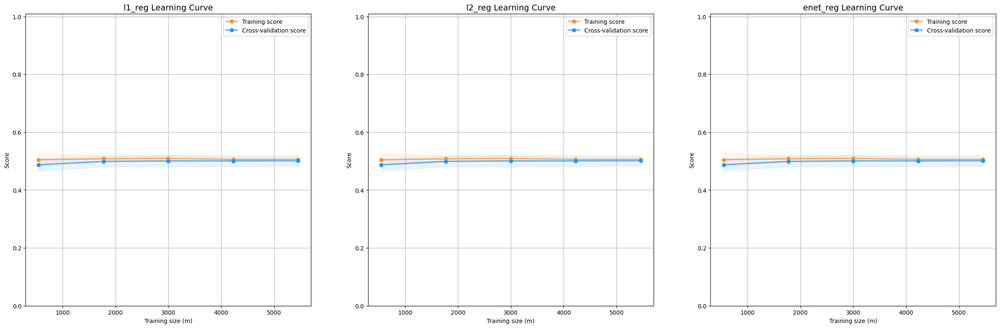

In [ ]:
# Example Usage
model_size = len(lin_models)
rs, cs = (model_size//3+1, 3 ) if model_size >= 3 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*10,rs*10),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(lin_models, X_train, y_train,  **lcs_params)

In [ ]:
lin_reg_results, lin_reg_metric_summary = tune_models(linear_tuners, X_train, y_train,X_test, y_test, is_clf=False, is_round=True)

Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits


In [ ]:
list(lin_reg_results.keys())

['lin_reg']

In [ ]:
lin_reg_metric_summary

,ExplainedVariance,MAE,MSE,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,R2,RMSE
lin_reg,0.484707,907.163517,1.415128e+06,6322.649,712.52,103.961856,0.484637,1189.591482


In [ ]:
from pprint import pprint
pprint(lin_reg_results)

{'lin_reg': {'metric_results': {'ExplainedVariance': 0.4847074046568476,
                                'MAE': 907.1635170674487,
                                'MSE': 1415127.8935450267,
                                'MaxError': 6322.648999999999,
                                'MeanAbsoluteError': 712.52,
                                'MeanAbsolutePercentageError': 103.96185572794604,
                                'R2': 0.48463675563888675,
                                'RMSE': 1189.5914817890327},
             'tune_results': {'best_params': {'copy_X': [True],
                                              'fit_intercept': [True]},
                              'cv_model': GridSearchCV(cv=10, estimator=LinearRegression(), n_jobs=-1,
             param_grid={'copy_X': [True], 'fit_intercept': [True]}, verbose=2),
                              'tuned_model': LinearRegression()}}}


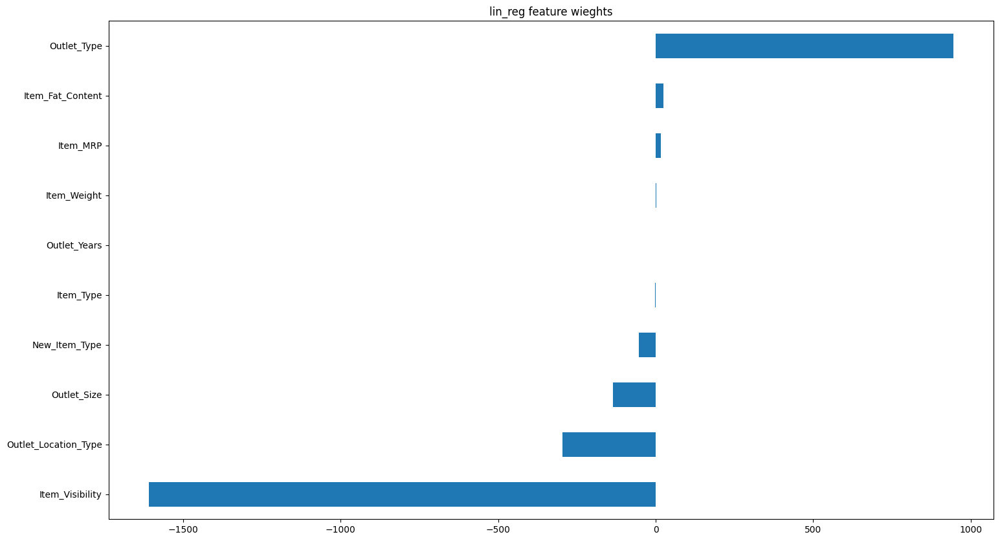

In [ ]:
size = len(lin_reg_results.keys())
rs, cs = (size//5+1, 5) if size>=5 else (size//3+1, 3)

plt.figure(figsize=(cs*20, rs*10))
lin_reg_models = dict()
for i, model_name in enumerate(lin_reg_results.keys()):

  cur_model = lin_reg_results[model_name]["tune_results"]["tuned_model"]
  lin_reg_models[model_name] = cur_model

  plt.subplot(rs,cs,i+1)
  pd.Series(cur_model.coef_, X_train.columns).sort_values().plot(kind="barh")
  plt.title(f"{model_name} feature wieghts")

0.turn [lin_reg], plotting learning curve


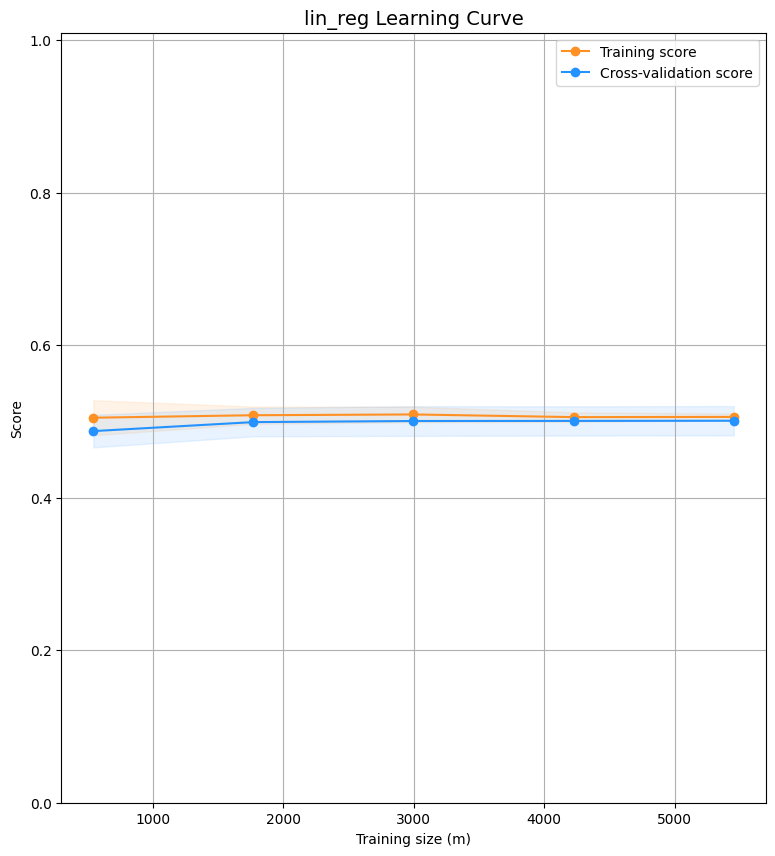

In [ ]:
# Example Usage
model_size = len(lin_reg_models)
rs, cs = (model_size//2+1, 4 ) if model_size >= 4 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*10,rs*10),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(lin_reg_models, X_train, y_train,  **lcs_params)

## (2) Non-Linear Models 

##### Hyperparams

In [ ]:
knn_params = {
    "n_neighbors": np.arange(1, 31, 2),
    "weights": ["uniform", "distance"],
    "algorithm": ["auto", "ball_tree", "kd_tree", "brute"],
    "leaf_size": np.arange(20, 61, 10),
    "p": [1, 2],
}
from sklearn.neighbors import KNeighborsRegressor
knn_reg = [KNeighborsRegressor(), knn_params]

In [ ]:
svr_params = {
    "C": np.logspace(-3, 3, 7),
    "kernel": ["linear","rbf"],#["linear", "poly", "rbf", "sigmoid"],
    #"degree": [2, 3, 4],
    ##"gamma": ["scale", "auto"] + list(np.logspace(-3, 3, 7)),
    ##"epsilon":[0.01, 0.1, 1, 10, 100],
    #"coef0": np.linspace(-1, 1, 21),
    #"shrinking": [True, False],
    #"tol": [1e-4, 1e-3, 1e-2],
    #"max_iter": [-1, 500, 1000, 2000]
}
from sklearn.svm import SVR
svr_reg = [SVR(), svr_params]

In [ ]:
dt_params = {
    "criterion": ["mse", "friedman_mse", "mae"],
    "splitter": ["best", "random"],
    "max_depth": [None, 5, 10, 15, 20],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 5],
    #"min_weight_fraction_leaf": [0.0, 0.1, 0.2],
    #"max_features": ["auto", "sqrt", "log2", None],
    #"random_state": [0, 42, 123],
    #"presort": [True, False]
}
from sklearn.tree import DecisionTreeRegressor
dt_reg = [DecisionTreeRegressor(), dt_params]

In [ ]:
non_lin_reg_tuners = {
    "knn_reg":knn_reg,
    "svr_reg":svr_reg,
    "dt_reg":dt_reg
}

##### Tuning Demostration

In [ ]:
non_lin_results, non_lin_metric_summary = tune_models(non_lin_reg_tuners, X_train, y_train, X_test, y_test, is_clf=False, is_round=True)

Fitting 10 folds for each of 15 candidates, totalling 150 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 5 candidates, totalling 50 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 7 candidates, totalling 70 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 5 candidates, totalling 50 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits


In [ ]:
list(non_lin_results.keys())

['knn_reg', 'svr_reg', 'dt_reg']

In [ ]:
non_lin_metric_summary

,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,MSE,RMSE,MAE,R2,ExplainedVariance
knn_reg,5931.649,616.832,88.115279,1.477983e+06,1215.723344,877.541854,0.461746,0.463383
svr_reg,6600.649,687.332,95.814126,1.427330e+06,1194.709329,896.482492,0.480193,0.483724
dt_reg,6256.649,497.768,57.281541,1.168111e+06,1080.792046,760.602946,0.574596,0.574596


In [ ]:
from pprint import pprint
pprint(non_lin_results)

{'dt_reg': {'metric_results': {'ExplainedVariance': 0.5745962198609662,
                               'MAE': 760.6029458064515,
                               'MSE': 1168111.4468198656,
                               'MaxError': 6256.648999999999,
                               'MeanAbsoluteError': 497.76800000000003,
                               'MeanAbsolutePercentageError': 57.28154079912938,
                               'R2': 0.5745955487455131,
                               'RMSE': 1080.7920460569026},
            'tune_results': {'best_params': {'criterion': ['friedman_mse'],
                                             'max_depth': [5],
                                             'min_samples_leaf': [5],
                                             'min_samples_split': [2],
                                             'splitter': ['best']},
                             'cv_model': GridSearchCV(cv=10, estimator=DecisionTreeRegressor(), n_jobs=-1,
             param_grid={'

In [ ]:
size = len(non_lin_results.keys())
rs, cs = (size//5+1, 5) if size>=5 else (size//3+1, 3)

plt.figure(figsize=(cs*20, rs*10))
non_lin_reg_models = dict()
for i, model_name in enumerate(non_lin_results.keys()):
  

  cur_model = non_lin_results[model_name]["tune_results"]["tuned_model"]
  non_lin_reg_models[model_name] = cur_model

  #if model_name in ["dt_reg","knn_reg"]: continue
  #
  # plt.subplot(rs,cs,i+1)
  # pd.Series(cur_model.coef_, X_train.columns).sort_values().plot(kind="barh")
  # plt.title(f"{model_name} feature wieghts")

<Figure size 6000x2000 with 0 Axes>

In [ ]:
# Example Usage
model_size = len(non_lin_reg_models)
rs, cs = (model_size//2+1, 4 ) if model_size >= 4 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*10,rs*10),
    "ylim" : (0.0, 1.01)
}

#lc_plot  = get_learning_curve_stats(non_lin_reg_models, X_train, y_train,  **lcs_params)

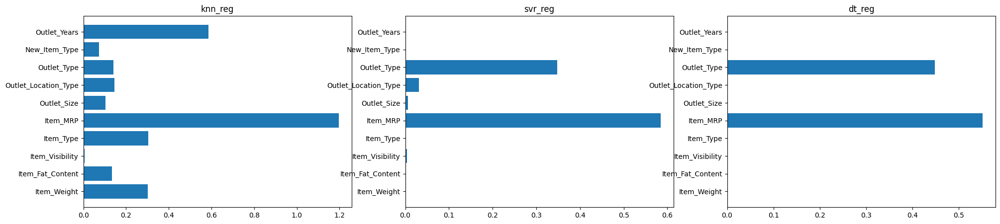

In [ ]:
from sklearn.inspection import permutation_importance

size = len(non_lin_results.keys())
rs, cs = (size//5+1, 5) if size>=5 else (size//4+1, 4)

plt.figure(figsize=(cs*8, rs*5))
# plot feature importance for each model
for i, (name, model) in enumerate(non_lin_reg_models.items()):
    
    # Extracting the importance
    if hasattr(model, 'feature_importances_'):
        # for tree-based models
        importances = model.feature_importances_
    else:
        # for non-tree-based models
        result = permutation_importance(model, X_train, y_train, n_repeats=10, random_state=0)
        importances = result.importances_mean
    
    plt.subplot(rs,cs,i+1)
    plt.barh( X_train.columns, importances)
    plt.title(name)
    #plt.yticks(range(len(indices)), [f'feature {i+1}' for i in indices])
    #plt.xlabel('Relative Importance')


0.turn [knn_reg], plotting learning curve
1.turn [svr_reg], plotting learning curve
2.turn [dt_reg], plotting learning curve


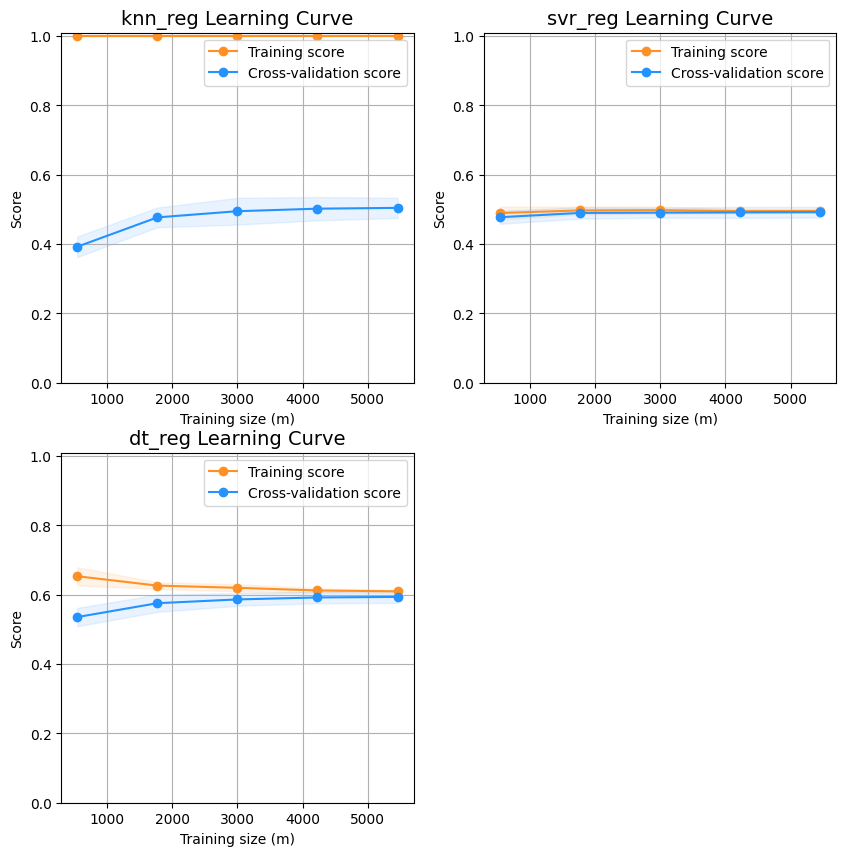

In [ ]:
# Example Usage
model_size = len(non_lin_reg_models)
rs, cs = (model_size//2+1, 4 ) if model_size >= 4 else (model_size//4+1, 4)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*5,rs*5),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(non_lin_reg_models, X_train, y_train,  **lcs_params)

## (3) Ensemble Models

### Hyperparams

In [ ]:
bag_params = {
    "base_estimator": [None, DecisionTreeRegressor(), SVR()],
    "n_estimators": [10, 20, 30, 40, 50],
    "max_samples": [1.0, 0.8, 0.5, 0.3],
    "max_features": [1.0, 0.8, 0.5, 0.3],
    "bootstrap": [True, False],
    "bootstrap_features": [True, False],
    "oob_score": [True, False],
    "warm_start": [True, False],
    "random_state": [0, 42, 123]
}
from sklearn.ensemble import BaggingRegressor
bag_reg = [BaggingRegressor(), bag_params]

In [ ]:
rf_params = {
    "n_estimators": [10, 20, 30, 40, 50],
    #"criterion": ["mse", "mae"],
    "max_depth": [None, 5, 10, 15, 20],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 5],
    "min_weight_fraction_leaf": [0.0, 0.1, 0.2],
    "max_features": ["auto", "sqrt", "log2", None],
    "max_leaf_nodes": [None, 5, 10, 20],
    "bootstrap": [True, False],
    "oob_score": [True, False],
    "warm_start": [True, False],
    "random_state": [0, 42, 123]
}
from sklearn.ensemble import RandomForestRegressor
rf_reg = [RandomForestRegressor(), rf_params]

In [ ]:
gbr_params = {
    "loss": ["ls", "lad", "huber", "quantile"],
    "learning_rate": [0.1, 0.05, 0.01],
    "n_estimators": [100, 200, 300, 400, 500],
    "criterion": ["friedman_mse", "mse", "mae"],
    "max_depth": [3, 4, 5, 6, 7],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 5],
    "min_weight_fraction_leaf": [0.0, 0.1, 0.2],
    "subsample": [1.0, 0.8, 0.5],
    "max_features": ["auto", "sqrt", "log2", None],
    "alpha": [0.9, 0.8, 0.7],
    "warm_start": [True, False],
    "random_state": [0, 42, 123]
}
from sklearn.ensemble import GradientBoostingRegressor
gbr = [GradientBoostingRegressor(), gbr_params]

In [ ]:
#!pip install xgboost
xgbr_params = {
    "learning_rate": [0.1, 0.05, 0.01, 0.005],
    "n_estimators": [100, 200, 300, 400, 500],
    "max_depth": [3, 4, 5, 6, 7],
    "min_child_weight": [1, 2, 5, 10],
    "gamma": [0.0, 0.1, 0.2, 0.3],
    "subsample": [1.0, 0.8, 0.5],
    "colsample_bytree": [1.0, 0.8, 0.5],
    "reg_alpha": [0.0, 0.1, 0.5, 1.0],
    "reg_lambda": [0.0, 0.1, 0.5, 1.0],
    "scale_pos_weight": [1, 2, 5],
    "objective": ["reg:squarederror"],
    "booster": ["gbtree", "gblinear", "dart"],
    "random_state": [0, 42, 123]
}
from xgboost import XGBRegressor
xgbr = [XGBRegressor(), xgbr_params]

In [ ]:
#!pip install lightgbm ##conda install -c conda-forge lightgbm
lgbm_params = {
    "boosting_type": ["gbdt", "dart", "goss"],
    "num_leaves": [31, 50, 100],
    "max_depth": [-1, 3, 4, 5, 6, 7],
    "learning_rate": [0.1, 0.05, 0.01, 0.005],
    "n_estimators": [100, 200, 300, 400, 500],
    "min_child_weight": [1, 2, 5, 10],
    "subsample_for_bin": [200000, 500000, 1000000],
    "min_split_gain": [0.0, 0.1, 0.2, 0.3],
    "reg_alpha": [0.0, 0.1, 0.5, 1.0],
    "reg_lambda": [0.0, 0.1, 0.5, 1.0],
    "colsample_bytree": [1.0, 0.8, 0.5],
    "subsample": [1.0, 0.8, 0.5],
    "is_unbalance": [True, False],
    "objective": ["regression"],
    "random_state": [0, 42, 123]
}
from lightgbm import LGBMRegressor
lgbm_reg = [LGBMRegressor(), lgbm_params]

In [ ]:
!pip install catboost
catboost_params = {
    "learning_rate": [0.1, 0.05, 0.01, 0.005],
    "depth": [3, 4, 5, 6, 7],
    "l2_leaf_reg": [1, 2, 5, 10, 20],
    "iterations": [100, 200, 300, 400, 500],
    "border_count": [32, 64, 128, 256, 512],
    "boosting_type": ["Ordered", "Plain", "Poisson"],
    "random_strength": [1, 2, 5, 10],
    "one_hot_max_size": [2, 5, 10, 20, 50],
    "rsm": [0.5, 0.7, 0.9],
    "early_stopping_rounds": [5, 10, 20, 50],
    "task_type": ["CPU", "GPU"],
    "loss_function": ["RMSE"],
    "eval_metric": ["RMSE"],
}
from catboost import CatBoostRegressor
catboost_reg = [CatBoostRegressor(), catboost_params]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.6/76.6 MB 12.9 MB/s eta 0:00:00


In [ ]:
ensemble_tuners = {
    "bag_reg":bag_reg,
    "rf_reg":rf_reg,
    "gbr":gbr,
    "xgbr":xgbr,
    "lgbm_reg":lgbm_reg,
    "catboost_reg":catboost_reg
}

### Tuning Demostration

In [ ]:
ensemble_results, ensemble_metric_summary = tune_models(ensemble_tuners,X_train, y_train, X_test, y_test, is_clf=False, is_round=True)

Streaming output truncated to the last 5000 lines.
9:	learn: 1674.4560311	total: 40.8ms	remaining: 2s
10:	learn: 1670.1204615	total: 45.5ms	remaining: 2.02s
11:	learn: 1665.7485358	total: 50.1ms	remaining: 2.04s
12:	learn: 1661.4725811	total: 54.5ms	remaining: 2.04s
13:	learn: 1657.2772923	total: 58.9ms	remaining: 2.04s
14:	learn: 1653.0080788	total: 63.3ms	remaining: 2.04s
15:	learn: 1648.8123319	total: 68ms	remaining: 2.06s
16:	learn: 1644.9873467	total: 72.6ms	remaining: 2.06s
17:	learn: 1640.8522337	total: 77.3ms	remaining: 2.07s
18:	learn: 1636.7482273	total: 82.2ms	remaining: 2.08s
19:	learn: 1632.6726624	total: 92.3ms	remaining: 2.21s
20:	learn: 1628.9782010	total: 96ms	remaining: 2.19s
21:	learn: 1624.8555150	total: 101ms	remaining: 2.2s
22:	learn: 1620.7937181	total: 104ms	remaining: 2.15s
23:	learn: 1616.7823648	total: 108ms	remaining: 2.14s
24:	learn: 1612.8374229	total: 120ms	remaining: 2.29s
25:	learn: 1608.8529320	total: 125ms	remaining: 2.27s
26:	learn: 1604.8873792	tota

In [ ]:
list(ensemble_results)

['bag_reg', 'rf_reg', 'gbr', 'xgbr', 'lgbm_reg', 'catboost_reg']

In [ ]:
ensemble_metric_summary

,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,MSE,RMSE,MAE,R2,ExplainedVariance
bag_reg,6059.649,505.5350,58.943461,1.230121e+06,1109.108031,776.783833,0.552013,0.552408
rf_reg,6180.649,494.0720,57.939992,1.152137e+06,1073.376523,751.628995,0.580413,0.580442
gbr,6050.649,494.0488,58.697493,1.157335e+06,1075.794971,753.156017,0.578520,0.578904
xgbr,6191.649,501.8796,58.602868,1.142273e+06,1068.771829,749.535617,0.584005,0.584007
lgbm_reg,6150.649,504.4014,59.950274,1.145456e+06,1070.259994,751.686516,0.582846,0.582898
catboost_reg,6497.649,511.5482,72.491653,1.165931e+06,1079.782708,776.250712,0.575390,0.575482


In [ ]:
from pprint import pprint
pprint(ensemble_results)

{'bag_reg': {'metric_results': {'ExplainedVariance': 0.5524078854190899,
                                'MAE': 776.7838333137829,
                                'MSE': 1230120.624605672,
                                'MaxError': 6059.648999999999,
                                'MeanAbsoluteError': 505.5350000000001,
                                'MeanAbsolutePercentageError': 58.94346064734671,
                                'R2': 0.5520129601401804,
                                'RMSE': 1109.1080310797827},
             'tune_results': {'best_params': {'base_estimator': [None],
                                              'bootstrap': [True],
                                              'bootstrap_features': [False],
                                              'max_features': [1.0],
                                              'max_samples': [0.3],
                                              'n_estimators': [50],
                                              'oob_sco

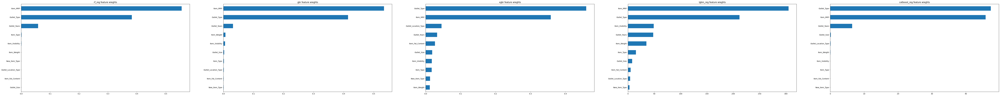

In [ ]:
es_model_names = [col for col in ensemble_results.keys() if col not in ["bag_reg"]]
size = len(es_model_names)
rs, cs = (size//5+1, 5) if size>=5 else (size//3+1, 3)

plt.figure(figsize=(cs*20, rs*10))
ensemble_reg_models = dict()
for i, model_name in enumerate(es_model_names):
  if model_name in ["bag_reg"]: continue

  cur_model = ensemble_results[model_name]["tune_results"]["tuned_model"]
  ensemble_reg_models[model_name] = cur_model

  plt.subplot(rs,cs,i+1)
  pd.Series(cur_model.feature_importances_, X_train.columns).sort_values().plot(kind="barh")
  plt.title(f"{model_name} feature wieghts")

0.turn [rf_reg], plotting learning curve
1.turn [gbr], plotting learning curve
2.turn [xgbr], plotting learning curve
3.turn [lgbm_reg], plotting learning curve
4.turn [catboost_reg], plotting learning curve


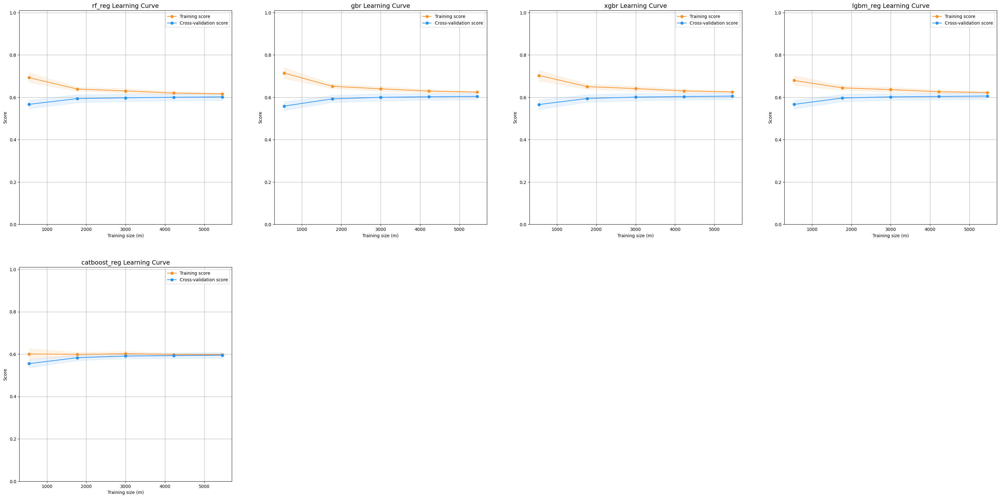

In [ ]:
# Example Usage
model_size = len(ensemble_reg_models)
rs, cs = (model_size//2+1, 4 ) if model_size >= 4 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*10,rs*10),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(ensemble_reg_models, X_train, y_train,  **lcs_params)

## (4) Final Model

### Top models

In [ ]:
# lin_results, lin_metric_summary
# lin_reg_results, lin_reg_metric_summary
# non_lin_results, non_lin_metric_summary
# ensemble_results, ensemble_metric_summary

In [ ]:
all_results = [lin_results, lin_reg_results, non_lin_results, ensemble_results]

In [ ]:
lin_models = pd.concat([lin_metric_summary, lin_reg_metric_summary])
lin_models = lin_models.sort_values(by=['RMSE','R2'], ascending=True)
lin_models

,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,MSE,RMSE,MAE,R2,ExplainedVariance
lin_reg,6322.649,712.5200,103.961856,1.415128e+06,1189.591482,907.163517,0.484637,0.484707
l1_reg,6325.649,710.2068,103.942886,1.415287e+06,1189.658286,907.207697,0.484579,0.484650
l2_reg,6326.649,712.2068,103.942175,1.415391e+06,1189.702037,907.254071,0.484541,0.484612
enet_reg,6326.649,712.7472,103.936455,1.415445e+06,1189.724800,907.272253,0.484521,0.484593


In [ ]:
non_linear_model = pd.concat([non_lin_metric_summary, ensemble_metric_summary])
non_linear_model = non_linear_model.sort_values(by=['RMSE','R2'],  ascending=False)
non_linear_model

,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,MSE,RMSE,MAE,R2,ExplainedVariance
knn_reg,5931.649,616.8320,88.115279,1.477983e+06,1215.723344,877.541854,0.461746,0.463383
svr_reg,6600.649,687.3320,95.814126,1.427330e+06,1194.709329,896.482492,0.480193,0.483724
bag_reg,6059.649,505.5350,58.943461,1.230121e+06,1109.108031,776.783833,0.552013,0.552408
dt_reg,6256.649,497.7680,57.281541,1.168111e+06,1080.792046,760.602946,0.574596,0.574596
catboost_reg,6497.649,511.5482,72.491653,1.165931e+06,1079.782708,776.250712,0.575390,0.575482
gbr,6050.649,494.0488,58.697493,1.157335e+06,1075.794971,753.156017,0.578520,0.578904
rf_reg,6180.649,494.0720,57.939992,1.152137e+06,1073.376523,751.628995,0.580413,0.580442
lgbm_reg,6150.649,504.4014,59.950274,1.145456e+06,1070.259994,751.686516,0.582846,0.582898
xgbr,6191.649,501.8796,58.602868,1.142273e+06,1068.771829,749.535617,0.584005,0.584007


In [ ]:
non_linear_model.index

Index(['knn_reg', 'svr_reg', 'bag_reg', 'dt_reg', 'catboost_reg', 'gbr',
       'rf_reg', 'lgbm_reg', 'xgbr'],
      dtype='object')

In [ ]:
all_models = pd.concat([lin_metric_summary, lin_reg_metric_summary, non_lin_metric_summary, ensemble_metric_summary])
all_models = all_models.sort_values(by=['RMSE','R2'], ascending=True)
all_models

,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,MSE,RMSE,MAE,R2,ExplainedVariance
xgbr,6191.649,501.8796,58.602868,1.142273e+06,1068.771829,749.535617,0.584005,0.584007
lgbm_reg,6150.649,504.4014,59.950274,1.145456e+06,1070.259994,751.686516,0.582846,0.582898
rf_reg,6180.649,494.0720,57.939992,1.152137e+06,1073.376523,751.628995,0.580413,0.580442
gbr,6050.649,494.0488,58.697493,1.157335e+06,1075.794971,753.156017,0.578520,0.578904
catboost_reg,6497.649,511.5482,72.491653,1.165931e+06,1079.782708,776.250712,0.575390,0.575482
dt_reg,6256.649,497.7680,57.281541,1.168111e+06,1080.792046,760.602946,0.574596,0.574596
bag_reg,6059.649,505.5350,58.943461,1.230121e+06,1109.108031,776.783833,0.552013,0.552408
lin_reg,6322.649,712.5200,103.961856,1.415128e+06,1189.591482,907.163517,0.484637,0.484707
l1_reg,6325.649,710.2068,103.942886,1.415287e+06,1189.658286,907.207697,0.484579,0.484650
l2_reg,6326.649,712.2068,103.942175,1.415391e+06,1189.702037,907.254071,0.484541,0.484612


### Greedy Selection

In [ ]:
best_model_name = all_models.iloc[0].name
best_model_name

'xgbr'

In [ ]:
tuned_model, best_params = None, None
for results in all_results:
  if best_model_name in results:
      tuned_model = results[best_model_name]["tune_results"]["tuned_model"]
      best_params = results[best_model_name]["tune_results"]["best_params"]

In [ ]:
tuned_model.score(X_test, y_test)

0.5840039854442374

In [ ]:
from sklearn.model_selection import cross_val_score
cross_val_score(tuned_model, X_test, y_test, cv=5).mean()

0.5618529027483576

# (F) Saving & Downloading the model

### Saving the model

In [ ]:
import pickle
model_save_path = 'finalized_model.sav'
pickle.dump(tuned_model, open(model_save_path, 'wb'))

In [ ]:
import json

# Extracting the encodings of categorical variables 
classes = dict()
for col, encoder in encoders.items():
  classes[col] = {i:cls for i, cls in enumerate(encoder.classes_)}

# Saving the cat encodings
endoing_json_path = "cat_encods.json"
with open(endoing_json_path,"w+") as f: json.dump(classes, f)

In [ ]:
for col, encoder in encoders.items():
  print(f"{col:<20} {encoder.classes_}")

Item_Fat_Content     ['Low Fat' 'Non-Edible' 'Regular']
Item_Type            ['Baking Goods' 'Breads' 'Breakfast' 'Canned' 'Dairy' 'Frozen Foods'
 'Fruits and Vegetables' 'Hard Drinks' 'Health and Hygiene' 'Household'
 'Meat' 'Others' 'Seafood' 'Snack Foods' 'Soft Drinks' 'Starchy Foods']
Outlet_Size          ['High' 'Medium' 'Small']
Outlet_Location_Type ['Tier 1' 'Tier 2' 'Tier 3']
Outlet_Type          ['Grocery Store' 'Supermarket Type1' 'Supermarket Type2'
 'Supermarket Type3']
New_Item_Type        ['Drinks' 'Food' 'Non-Consumable']


In [ ]:
imverse_class = {}
for col, clss in classes.items():
  imverse_class[col]  = {val:key for key, val in clss.items()}

### Loading the model

In [ ]:
loaded_model = pickle.load(open(model_save_path, 'rb'))

In [ ]:
loaded_model.score(X_test, y_test)

0.5840039854442374

In [ ]:
import json

# loading the encodings of categorical variables
loaded_cls_enc = json.load(open(endoing_json_path, "r"))
loaded_cls_enc 

{'Item_Fat_Content': {'0': 'Low Fat', '1': 'Non-Edible', '2': 'Regular'},
 'Item_Type': {'0': 'Baking Goods',
  '1': 'Breads',
  '2': 'Breakfast',
  '3': 'Canned',
  '4': 'Dairy',
  '5': 'Frozen Foods',
  '6': 'Fruits and Vegetables',
  '7': 'Hard Drinks',
  '8': 'Health and Hygiene',
  '9': 'Household',
  '10': 'Meat',
  '11': 'Others',
  '12': 'Seafood',
  '13': 'Snack Foods',
  '14': 'Soft Drinks',
  '15': 'Starchy Foods'},
 'Outlet_Size': {'0': 'High', '1': 'Medium', '2': 'Small'},
 'Outlet_Location_Type': {'0': 'Tier 1', '1': 'Tier 2', '2': 'Tier 3'},
 'Outlet_Type': {'0': 'Grocery Store',
  '1': 'Supermarket Type1',
  '2': 'Supermarket Type2',
  '3': 'Supermarket Type3'},
 'New_Item_Type': {'0': 'Drinks', '1': 'Food', '2': 'Non-Consumable'}}

### Zipping the model
```python
import os 
zip_dst, src = f"{model_save_path}.zip", model_save_path
os.system(f"zip -r {zip_dst} {src}" )
```

### Downloading the model

In [ ]:
from google.colab import files
files.download(model_save_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
files.download(endoing_json_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# (G) Deployment as App

## APP (loading from file)

### Declerations & Util Funcs

In [ ]:
!pip install gradio
import gradio as gr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 42.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.5/140.5 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.8/57.8 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 kB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.1/200.1 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.3/75.3 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 k

In [ ]:
import pickle
import json 
import numpy as np
import pandas as pd

# File Paths
model_path = 'finalized_model.sav'
endoing_path = "cat_encods.json"
component_config_path = "component_configs.json"
examples_path = "examples.pkl"

# predefined
target = "Item_Outlet_Sales"

feature_order = ['Item_Weight', 'Item_Fat_Content', 'Item_Visibility', 'Item_Type',
                 'Item_MRP', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type',
                 'New_Item_Type', 'Outlet_Years']

# Loading the files
model = pickle.load(open(model_path, 'rb'))

# loading the classes & type casting the encoding indexes
classes = json.load(open(endoing_path, "r"))
classes = {k:{int(num):cat for num,cat in v.items() } for k,v in classes.items()}

inverse_class = {col:{val:key for key, val in clss.items()}  for col, clss in classes.items()}

#classes[target].values()
examples = pickle.load(open(examples_path, 'rb'))

feature_limitations = json.load(open(component_config_path, "r"))

In [ ]:
def decode(col, data):
  return classes[col][data]

def encode(col, str_data):
  return inverse_class[col][str_data]

def feature_decode(df):

  # exclude the target var
  cat_cols = list(classes.keys())
  if "Item_Outlet_Sales" in cat_cols:
    cat_cols.remove("Item_Outlet_Sales")

  for col in cat_cols:
     df[col] = decode(col, df[col])

  return df

def feature_encode(df):
  
  # exclude the target var
  cat_cols = list(classes.keys())
  if "Item_Outlet_Sales" in cat_cols:
    cat_cols.remove("Item_Outlet_Sales")
  
  for col in cat_cols:
     df[col] = encode(col, df[col])
  
  return df

In [ ]:
def predict(*args):

  # preparing the input into convenient form
  features = pd.Series([*args], index=feature_order)
  features = feature_encode(features)
  features = np.array(features).reshape(-1,len(feature_order))

  # prediction
  pred = model.predict(features) #.predict(features)


  return np.round(pred, 3)

In [ ]:
ex_data = [14.15, 'Regular', 0.024454052, 'Fruits and Vegetables', 197.211, 'Small', 'Tier 2', 'Supermarket Type1', 'Food', 11.0]
predict(*ex_data)

array([3139.662], dtype=float32)

In [ ]:
#examples = [ list(feature_decode(X_test.iloc[i]).values ) for i in range(5) ]
#examples

[[18.75,
  'Non-Edible',
  0.052040915,
  'Health and Hygiene',
  105.728,
  'Small',
  'Tier 1',
  'Supermarket Type1',
  'Non-Consumable',
  16.0],
 [17.5,
  'Low Fat',
  0.026182758,
  'Snack Foods',
  253.6356,
  'Medium',
  'Tier 1',
  'Supermarket Type1',
  'Food',
  14.0],
 [5.26,
  'Regular',
  0.041857101,
  'Baking Goods',
  162.7868,
  'Small',
  'Tier 2',
  'Supermarket Type1',
  'Food',
  11.0],
 [7.975,
  'Low Fat',
  0.014653896,
  'Baking Goods',
  82.425,
  'Medium',
  'Tier 1',
  'Supermarket Type1',
  'Food',
  14.0],
 [15.1,
  'Regular',
  0.067020992,
  'Snack Foods',
  260.3304,
  'High',
  'Tier 3',
  'Supermarket Type1',
  'Food',
  26.0]]

In [ ]:
#import pickle 
#with open("examples.pkl","wb") as f: pickle.dump(examples, f)

### Declerating the components

In [ ]:
import gradio as gr


inputs = list()
for col in feature_order:
  if col in feature_limitations["cat"].keys():
    
    # extracting the params
    vals = feature_limitations["cat"][col]["values"]
    def_val = feature_limitations["cat"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Dropdown(vals, default=def_val, label=col))
  else:
    
    # extracting the params
    min = feature_limitations["num"][col]["min"]
    max = feature_limitations["num"][col]["max"]
    def_val = feature_limitations["num"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Slider(minimum=min, maximum=max, default=def_val, label=col) )


### Launching the demo app

In [ ]:
import gradio as gr
# Creating application
gr.Interface(predict, inputs, "number",examples=examples).launch()

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>

## Manuels (with out file, code form)

### Declerations & Util Funcs

In [ ]:
!pip install gradio
import gradio as gr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.2/14.2 MB 94.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.2/56.2 KB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.0/107.0 KB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.7/140.7 KB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 KB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 KB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 KB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.5/71.5 KB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 90.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 KB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 K

### Extracting the input params

In [ ]:
ex_obs_fea, ex_obs_tar = dict(X_test.iloc[0,:]), y_test.iloc[0]
ex_obs_fea, ex_obs_tar

({'Item_Weight': 14.15,
  'Item_Fat_Content': 2.0,
  'Item_Visibility': 0.024454052,
  'Item_Type': 6.0,
  'Item_MRP': 197.211,
  'Outlet_Size': 2.0,
  'Outlet_Location_Type': 1.0,
  'Outlet_Type': 1.0,
  'New_Item_Type': 1.0,
  'Outlet_Years': 11.0},
 3731.809)

In [ ]:
encoders.keys()

dict_keys(['Item_Fat_Content', 'Item_Type', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type', 'New_Item_Type'])

In [ ]:
def_vals = ex_obs_fea.copy()
for col in encoders.keys():
  def_vals[col] = decode(col, def_vals[col])
def_vals

{'Item_Weight': 14.15,
 'Item_Fat_Content': 'Regular',
 'Item_Visibility': 0.024454052,
 'Item_Type': 'Fruits and Vegetables',
 'Item_MRP': 197.211,
 'Outlet_Size': 'Small',
 'Outlet_Location_Type': 'Tier 2',
 'Outlet_Type': 'Supermarket Type1',
 'New_Item_Type': 'Food',
 'Outlet_Years': 11.0}

In [ ]:
feature_order = ex_obs_fea.keys()
feature_order

dict_keys(['Item_Weight', 'Item_Fat_Content', 'Item_Visibility', 'Item_Type', 'Item_MRP', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type', 'New_Item_Type', 'Outlet_Years'])

In [ ]:
def_vals.values()

dict_values([14.15, 'Regular', 0.024454052, 'Fruits and Vegetables', 197.211, 'Small', 'Tier 2', 'Supermarket Type1', 'Food', 11.0])

In [ ]:
predict(*list(def_vals.values()))

array([3135.273])

In [ ]:
ex_obs_fea

{'Item_Weight': 14.15,
 'Item_Fat_Content': 2.0,
 'Item_Visibility': 0.024454052,
 'Item_Type': 6.0,
 'Item_MRP': 197.211,
 'Outlet_Size': 2.0,
 'Outlet_Location_Type': 1.0,
 'Outlet_Type': 1.0,
 'New_Item_Type': 1.0,
 'Outlet_Years': 11.0}

In [ ]:
tfm_cols = [
  "fare"
]

In [ ]:
num_columns = [col for col in df.select_dtypes(exclude=("object","category")).columns if col !="Item_Outlet_Sales"]
num_columns

['Item_Weight',
 'Item_Fat_Content',
 'Item_Visibility',
 'Item_Type',
 'Item_MRP',
 'Outlet_Size',
 'Outlet_Location_Type',
 'Outlet_Type',
 'New_Item_Type',
 'Outlet_Years']

In [ ]:
cat_cols = list(encoders.keys())
cat_cols

['Item_Fat_Content',
 'Item_Type',
 'Outlet_Size',
 'Outlet_Location_Type',
 'Outlet_Type',
 'New_Item_Type']

In [ ]:
import numpy as np
num_limitations = {}
for col in num_columns:
  if col in tfm_cols:
    # Inverse log transformation, so it is exp transformation
    re_trmd = np.exp(df[col])
    
    num_limitations[col] = {
        "min": np.floor(re_trmd.min()),
        "max": np.ceil(re_trmd.max()),
        "def": np.floor(np.exp(ex_obs_fea[col]))
    }
  else:
    num_limitations[col] = {
        "min": np.floor(df[col].min()),
        "max": np.ceil(df[col].max()),
        "def": np.floor(ex_obs_fea[col])
    }

In [ ]:
cat_cols

['Item_Fat_Content',
 'Item_Type',
 'Outlet_Size',
 'Outlet_Location_Type',
 'Outlet_Type',
 'New_Item_Type']

In [ ]:
classes

{'Item_Fat_Content': {0: 'Low Fat', 1: 'Non-Edible', 2: 'Regular'},
 'Item_Type': {0: 'Baking Goods',
  1: 'Breads',
  2: 'Breakfast',
  3: 'Canned',
  4: 'Dairy',
  5: 'Frozen Foods',
  6: 'Fruits and Vegetables',
  7: 'Hard Drinks',
  8: 'Health and Hygiene',
  9: 'Household',
  10: 'Meat',
  11: 'Others',
  12: 'Seafood',
  13: 'Snack Foods',
  14: 'Soft Drinks',
  15: 'Starchy Foods'},
 'Outlet_Size': {0: 'High', 1: 'Medium', 2: 'Small'},
 'Outlet_Location_Type': {0: 'Tier 1', 1: 'Tier 2', 2: 'Tier 3'},
 'Outlet_Type': {0: 'Grocery Store',
  1: 'Supermarket Type1',
  2: 'Supermarket Type2',
  3: 'Supermarket Type3'},
 'New_Item_Type': {0: 'Drinks', 1: 'Food', 2: 'Non-Consumable'}}

In [ ]:
cat_limitations ={}
for col in cat_cols:
  cat_limitations[col] = {
      "values": list(classes[col].values()),
      "def": decode(col, ex_obs_fea[col])
  }

In [ ]:
cat_limitations

{'Item_Fat_Content': {'values': ['Low Fat', 'Non-Edible', 'Regular'],
  'def': 'Regular'},
 'Item_Type': {'values': ['Baking Goods',
   'Breads',
   'Breakfast',
   'Canned',
   'Dairy',
   'Frozen Foods',
   'Fruits and Vegetables',
   'Hard Drinks',
   'Health and Hygiene',
   'Household',
   'Meat',
   'Others',
   'Seafood',
   'Snack Foods',
   'Soft Drinks',
   'Starchy Foods'],
  'def': 'Fruits and Vegetables'},
 'Outlet_Size': {'values': ['High', 'Medium', 'Small'], 'def': 'Small'},
 'Outlet_Location_Type': {'values': ['Tier 1', 'Tier 2', 'Tier 3'],
  'def': 'Tier 2'},
 'Outlet_Type': {'values': ['Grocery Store',
   'Supermarket Type1',
   'Supermarket Type2',
   'Supermarket Type3'],
  'def': 'Supermarket Type1'},
 'New_Item_Type': {'values': ['Drinks', 'Food', 'Non-Consumable'],
  'def': 'Food'}}

In [ ]:
total_limitations = {
    "num":num_limitations,
    "cat":cat_limitations
}

In [ ]:
feature_limitations = total_limitations.copy()
# removing target classes
#del feature_limitations["cat"]["Loan_Status"]

In [ ]:
component_config_path = "component_configs.json"
with open(component_config_path,"w+") as f: json.dump(feature_limitations, f)

In [ ]:
print(json.dumps(feature_limitations, indent=4))

{
    "num": {
        "Item_Weight": {
            "min": 4.0,
            "max": 22.0,
            "def": 14.0
        },
        "Item_Fat_Content": {
            "min": 0.0,
            "max": 2.0,
            "def": 2.0
        },
        "Item_Visibility": {
            "min": 0.0,
            "max": 1.0,
            "def": 0.0
        },
        "Item_Type": {
            "min": 0.0,
            "max": 15.0,
            "def": 6.0
        },
        "Item_MRP": {
            "min": 31.0,
            "max": 267.0,
            "def": 197.0
        },
        "Outlet_Size": {
            "min": 0.0,
            "max": 2.0,
            "def": 2.0
        },
        "Outlet_Location_Type": {
            "min": 0.0,
            "max": 2.0,
            "def": 1.0
        },
        "Outlet_Type": {
            "min": 0.0,
            "max": 3.0,
            "def": 1.0
        },
        "New_Item_Type": {
            "min": 0.0,
            "max": 2.0,
            "def": 1.0
        },

In [ ]:
from google.colab import files
files.download(component_config_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Declerating the components

In [ ]:
import gradio as gr


inputs = list()
for col in feature_order:
  if col in feature_limitations["cat"].keys():
    
    # extracting the params
    vals = feature_limitations["cat"][col]["values"]
    def_val = feature_limitations["cat"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Dropdown(vals, default=def_val, label=col))
  else:
    
    # extracting the params
    min = feature_limitations["num"][col]["min"]
    max = feature_limitations["num"][col]["max"]
    def_val = feature_limitations["num"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Slider(minimum=min, maximum=max, default=def_val, label=col) )


### Launching the demo app

In [ ]:
import gradio as gr
# Creating application
gr.Interface(predict, inputs, "number").launch()

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>